任务一：点操作实验：实现线性拉伸、Gamma 变换、直方图均衡化，并对比直方图变化

此任务共三个单元格，分别为源代码运行，线性变换参数调整，gamma变换参数调整

直方图均衡化分析：


C:\Users\81349\AppData\Local\Temp\ipykernel_3664\1239893806.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


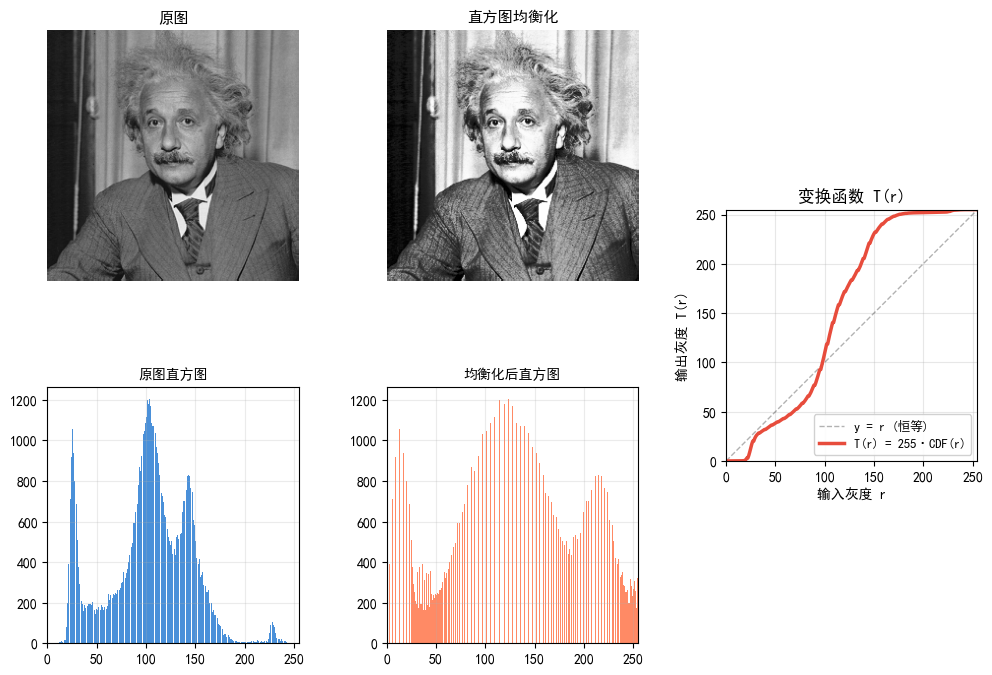

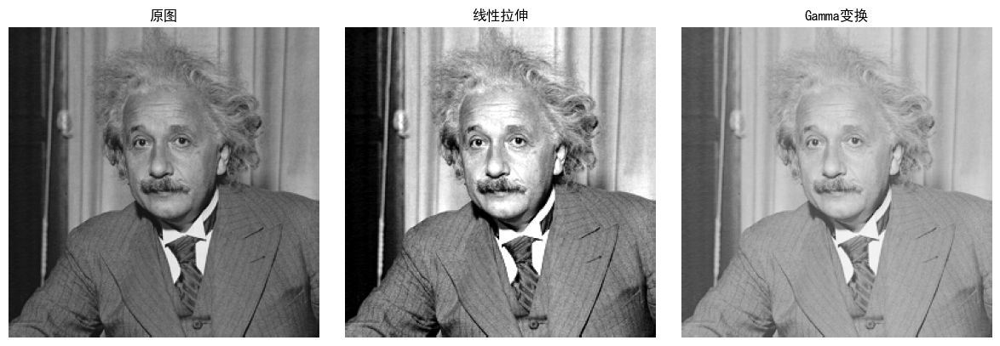

In [10]:
"""
实验1：点运算（线性拉伸 / Gamma / 直方图均衡）—— 纯算法版（兼容 Jupyter）
直接运行即可看到三种变换的对比结果，可修改参数后重新执行。
"""
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt

plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# ============================================================
#                       算法核心部分实现
# ============================================================

def compute_histogram(img):
    #计算 8 位灰度直方图（256 bins），返回计数数组
    hist = np.zeros(256, dtype=np.int64)
    flat = img.ravel()
    for v in flat:
        hist[int(v)] += 1
    return hist


def compute_percentile(img, p):
    #计算第 p 百分位灰度值（0 ≤ p ≤ 100）
    hist = compute_histogram(img)
    total = img.size
    target = total * p / 100.0
    cum = 0
    for k in range(256):
        cum += hist[k]
        if cum >= target:
            return k
    return 255


def linear_stretch(img, lo_pct=2, hi_pct=98, out_lo=0, out_hi=255):
    #分段线性拉伸（对比度拉伸）
    a = compute_percentile(img, lo_pct)
    b = compute_percentile(img, hi_pct)
    if b - a < 1:
        b = a + 1
    img_f = img.astype(np.float32)
    out = (img_f - a) / (b - a) * (out_hi - out_lo) + out_lo
    out = np.clip(out, 0, 255)
    return out.astype(np.uint8), a, b


def gamma_correction(img, gamma=1.0, c=1.0):
    #Gamma (幂律) 变换  T(r) = c·255·(r/255)^γ
    img_f = img.astype(np.float32) / 255.0
    out = c * np.power(img_f, gamma) * 255.0
    out = np.clip(out, 0, 255)
    return out.astype(np.uint8)


def histogram_equalization(img):
    #直方图均衡化（HE）
    hist = compute_histogram(img)
    cdf = np.zeros(256, dtype=np.float64)
    cdf[0] = hist[0]
    for k in range(1, 256):
        cdf[k] = cdf[k-1] + hist[k]
    cdf = cdf / img.size
    lut = np.round(255 * cdf).astype(np.uint8)
    out = lut[img]
    return out, cdf


# ============================================================
#                       演示部分
# ============================================================

def make_demo_image(size=256):
    """生成一个用于演示的合成灰度图"""
    x, y = np.meshgrid(np.arange(size), np.arange(size))
    img = (np.sin(x/20) * np.cos(y/25) * 30 + 90 + 20 * (x/255)).astype(np.float32)
    img[40:90, 40:90]   = 60
    img[40:90, 166:216] = 110
    img[166:216, 40:90] = 150
    img[166:216, 166:216] = 180
    img += np.random.randn(size, size) * 4
    return np.clip(img, 0, 255).astype(np.uint8)


def show_results(original, results, titles):
    """并排显示原图与多个处理结果"""
    n = len(results)
    fig, axes = plt.subplots(1, n+1, figsize=(4*(n+1), 4))
    if n+1 == 1:
        axes = [axes]
    axes[0].imshow(original, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('原图')
    axes[0].axis('off')
    for i, (img, title) in enumerate(zip(results, titles)):
        axes[i+1].imshow(img, cmap='gray', vmin=0, vmax=255)
        axes[i+1].set_title(title)
        axes[i+1].axis('off')
    plt.tight_layout()
    plt.show()

def plot_he_analysis(original, equalized, cdf):
    """
    展示直方图均衡化的完整分析：
    - 原图 & 均衡化图像
    - 原直方图 & 均衡化直方图
    - 变换函数 T(r) = 255·CDF(r)
    """
    # 计算两个直方图
    hist_orig = compute_histogram(original)
    hist_eq = compute_histogram(equalized)

    fig = plt.figure(figsize=(12, 8))
    # 网格布局：2行3列，中间列为变换函数（合并两行）
    gs = fig.add_gridspec(2, 3, height_ratios=[1, 1], hspace=0.4, wspace=0.35)

    # 原图
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(original, cmap='gray', vmin=0, vmax=255)
    ax1.set_title('原图', fontsize=11, fontweight='bold')
    ax1.axis('off')

    # 均衡化图像
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(equalized, cmap='gray', vmin=0, vmax=255)
    ax2.set_title('直方图均衡化', fontsize=11, fontweight='bold')
    ax2.axis('off')

    # 变换函数（占据右侧一整列）
    ax3 = fig.add_subplot(gs[:, 2])
    r = np.arange(256)
    ax3.plot(r, r, 'k--', alpha=0.3, lw=1, label='y = r (恒等)')
    ax3.plot(r, 255 * cdf, '#e74c3c', lw=2.5, label='T(r) = 255·CDF(r)')
    ax3.set_xlim(0, 255)
    ax3.set_ylim(0, 255)
    ax3.set_title('变换函数 T(r)', fontsize=12, fontweight='bold')
    ax3.set_xlabel('输入灰度 r')
    ax3.set_ylabel('输出灰度 T(r)')
    ax3.legend(fontsize=9, framealpha=0.9)
    ax3.grid(alpha=0.3)
    ax3.set_aspect('equal', 'box')

    # 原直方图（左下）
    ax4 = fig.add_subplot(gs[1, 0])
    ax4.bar(np.arange(256), hist_orig, width=1.0, color='#4a90d9')
    ax4.set_xlim(0, 255)
    ax4.set_title('原图直方图', fontsize=10)
    ax4.grid(alpha=0.25)

    # 均衡化直方图（左下中）
    ax5 = fig.add_subplot(gs[1, 1])
    ax5.bar(np.arange(256), hist_eq, width=1.0, color='#ff8a65')
    ax5.set_xlim(0, 255)
    ax5.set_title('均衡化后直方图', fontsize=10)
    ax5.grid(alpha=0.25)

    plt.tight_layout()
    plt.show()

# 如果直接运行本脚本（或在 Jupyter 中执行该单元格），则自动演示
# 原演示代码（只保留均衡化的分析，其他两种方法的结果仍可显示）
if __name__ == '__main__':
    IMAGE_PATH = 'einstein.png'         # 可改为图片路径
    LO_PCT = 2 #
    HI_PCT = 98 #
    GAMMA = 0.5 #
    C = 1.0

    # 读取图像
    if IMAGE_PATH:
        img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"⚠️  无法读取 {IMAGE_PATH}，改用内置演示图")
            img = make_demo_image()
    else:
        img = make_demo_image()

    # 执行三种变换（可根据需要注释掉其他）
    res_linear, a, b = linear_stretch(img, LO_PCT, HI_PCT)
    res_gamma = gamma_correction(img, GAMMA, C)
    res_he, cdf_he = histogram_equalization(img)

    # ----- 展示直方图均衡化的详细分析 -----
    print("直方图均衡化分析：")
    plot_he_analysis(img, res_he, cdf_he)

    # 如果需要单独查看线性拉伸和Gamma变换的图像，可继续使用原来的 show_results
    show_results(img, [res_linear, res_gamma], ["线性拉伸", "Gamma变换"])


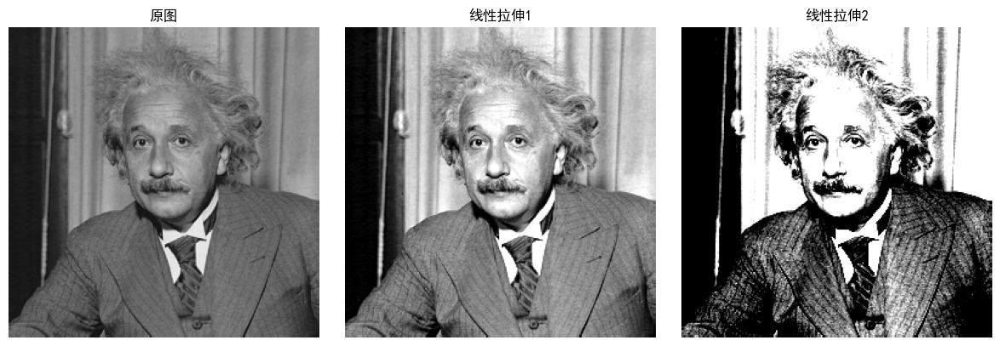

In [11]:
res_linear1, a1, b1 = linear_stretch(img,2, 98)
res_linear2, a2, b2 = linear_stretch(img, 30, 70)
show_results(img, [res_linear1, res_linear2], ["线性拉伸1", "线性拉伸2"])

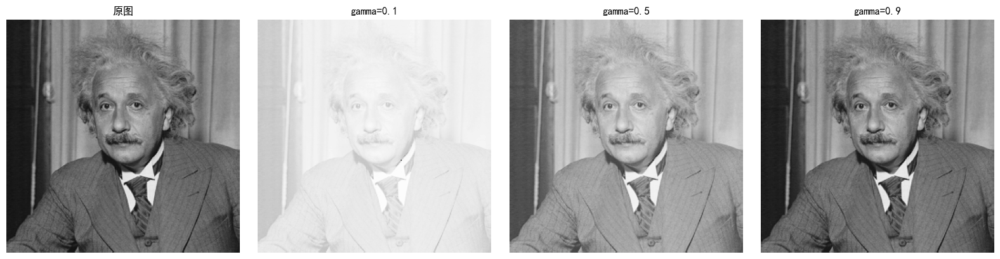

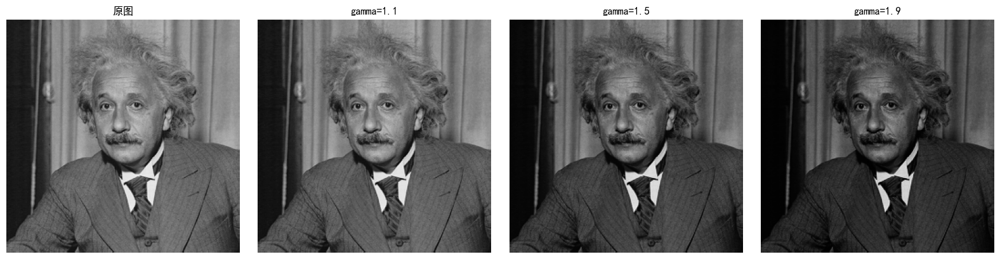

In [12]:
res_gamma1 = gamma_correction(img, 0.1, 1)
res_gamma2 = gamma_correction(img, 0.5, 1)
res_gamma3 = gamma_correction(img, 0.9, 1)
res_gamma4 = gamma_correction(img, 1.1, 1)
res_gamma5 = gamma_correction(img, 1.5, 1)
res_gamma6 = gamma_correction(img, 1.9, 1)
show_results(img,[res_gamma1,res_gamma2,res_gamma3],["gamma=0.1","gamma=0.5","gamma=0.9"])
show_results(img,[res_gamma4,res_gamma5,res_gamma6],["gamma=1.1","gamma=1.5","gamma=1.9"])

任务二：卷积与图像降噪：手工实现 2D 卷积；对比均值、高斯、中值滤波

此任务有多个单元格，第一个单元格为主要任务实现源代码，剩余单元格为参数调整，主要涉及噪声类型，滤波核大小

与 OpenCV 对比：最大绝对误差 = 4.58e-05,  平均绝对误差 = 2.79e-06


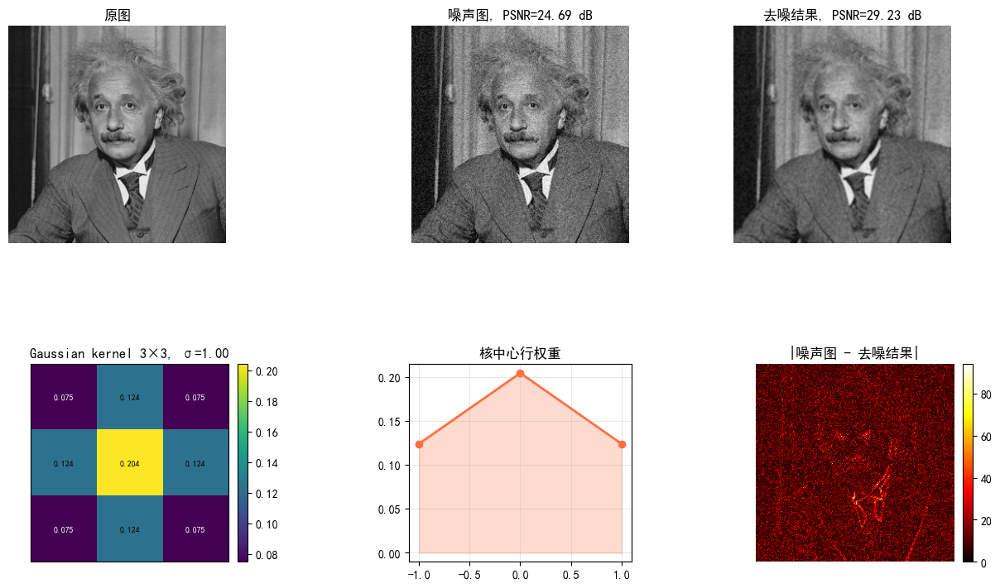

与 OpenCV 对比：最大绝对误差 = 3.05e-05,  平均绝对误差 = 2.49e-06


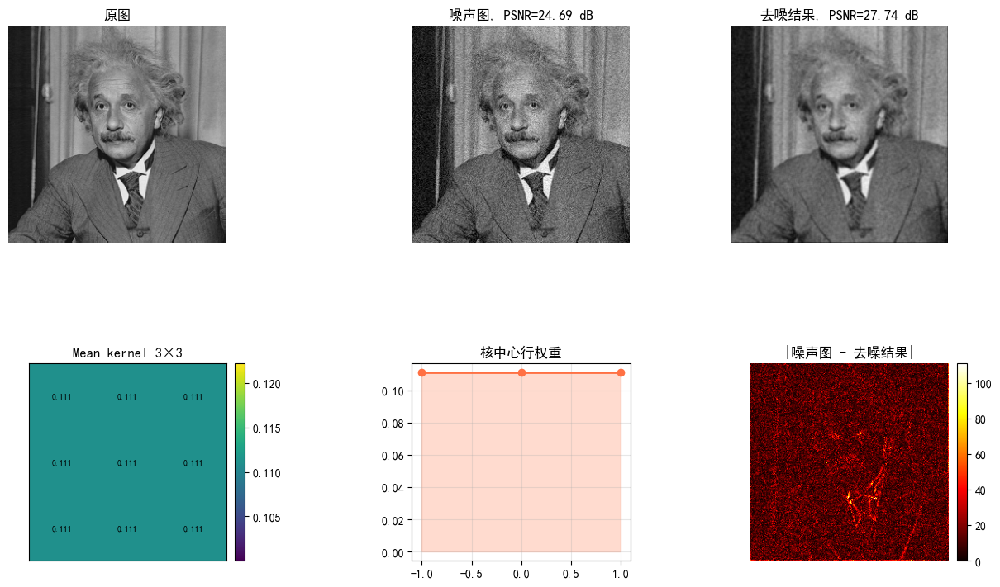

In [13]:
"""
实验2：卷积与图像去噪（无GUI版）
直接在 Jupyter 单元格运行或作为普通 Python 脚本执行。
"""
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ------------------------ 中文支持（可选）------------------------
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# ============================================================
#                        核心算法
# ============================================================

def pad_image(img, pH, pW, mode='reflect'):
#图像边界填充函数，zero零填充，edge边缘填充，reflect对称填充
    if img.ndim != 2:
        raise ValueError("只支持单通道灰度图")
    H, W = img.shape
    img_f = img.astype(np.float32)
    out = np.zeros((H + 2*pH, W + 2*pW), dtype=np.float32)
    out[pH:pH+H, pW:pW+W] = img_f

    if mode == 'zero':
        return out
    if mode == 'edge':
        if pH > 0:
            out[:pH, pW:pW+W] = img_f[0:1, :]
            out[pH+H:, pW:pW+W] = img_f[H-1:H, :]
        if pW > 0:
            out[:, :pW] = out[:, pW:pW+1]
            out[:, pW+W:] = out[:, pW+W-1:pW+W]
        return out
    # reflect
    if H <= pH or W <= pW:
        return np.pad(img_f, ((pH, pH), (pW, pW)), mode='reflect')
    if pH > 0:
        out[:pH, pW:pW+W] = img_f[pH:0:-1, :]
        out[pH+H:, pW:pW+W] = img_f[H-2:H-2-pH:-1, :]
    if pW > 0:
        out[:, :pW] = out[:, 2*pW:pW:-1]
        out[:, pW+W:] = out[:, pW+W-2:W-2:-1]
    return out

def convolve2d(img, kernel, pad_mode='reflect'):
#手动二维相关（对称核等价于卷积）
    H, W = img.shape
    kH, kW = kernel.shape
    pH, pW = kH//2, kW//2
    padded = pad_image(img.astype(np.float32), pH, pW, pad_mode)
    out = np.zeros((H, W), dtype=np.float32)
    for m in range(kH):
        for n in range(kW):
            out += kernel[m, n] * padded[m:m+H, n:n+W]
    return out

def make_gaussian_kernel(k, sigma):
#生成归一化高斯核
    k = int(k) | 1
    r = k//2
    kernel = np.zeros((k, k), dtype=np.float32)
    for i in range(k):
        for j in range(k):
            x, y = i-r, j-r
            kernel[i, j] = np.exp(-(x*x + y*y)/(2.0*sigma*sigma))
    return kernel / kernel.sum()

def mean_kernel(k):
#实现均值滤波核
    k = int(k) | 1
    return np.ones((k, k), dtype=np.float32) / float(k*k)

def add_gaussian_noise(img, sigma, mean=0):
#添加高斯噪声
    noise = np.random.randn(*img.shape) * sigma + mean
    return np.clip(img.astype(np.float32) + noise, 0, 255).astype(np.uint8)

def add_salt_pepper(img, p, salt_ratio=0.5):
#添加椒盐噪声
    out = img.copy()
    rnd = np.random.rand(*img.shape)
    salt_thr = p * salt_ratio
    pepper_thr = p
    out[rnd < salt_thr] = 255
    out[(rnd >= salt_thr) & (rnd < pepper_thr)] = 0
    return out

def median_filter(img, k, pad_mode='reflect'):
#手动中值滤波
    k = int(k) | 1
    H, W = img.shape
    r = k//2
    padded = pad_image(img.astype(np.float32), r, r, pad_mode)
    out = np.zeros_like(img)
    half = (k*k)//2
    for i in range(H):
        for j in range(W):
            patch = np.sort(padded[i:i+k, j:j+k].ravel())
            out[i, j] = patch[half]
    return out.astype(np.uint8)

def psnr(a, b):
#计算峰值信噪比
    mse = np.mean((a.astype(np.float32) - b.astype(np.float32))**2)
    return 99.0 if mse < 1e-6 else float(10 * np.log10(255**2 / mse))

def compare_with_cv2_filter2D(img, kernel, pad_mode='reflect'):
#与 OpenCV filter2D 对比验证
    manual = convolve2d(img, kernel.astype(np.float32), pad_mode)
    library = cv2.filter2D(
        img.astype(np.float32), cv2.CV_32F,
        kernel.astype(np.float32),
        borderType={'zero': cv2.BORDER_CONSTANT,
                    'edge': cv2.BORDER_REPLICATE,
                    'reflect': cv2.BORDER_REFLECT_101}[pad_mode]
    )
    diff = np.abs(manual - library)
    return {
        'manual': manual,
        'library': library,
        'max_abs_error': float(diff.max()),
        'mean_abs_error': float(diff.mean())
    }

def apply_denoising(img, noise_type='Gaussian noise', noise_level=15,
                    noise_mean=0, salt_ratio=0.5, filter_type='Gaussian filter',
                    kernel_size=3, sigma=1.0, pad_mode='reflect', seed=0):
#集成噪声添加与去噪，返回包含所有结果的字典
    np.random.seed(seed)
    k = int(kernel_size) | 1

    # 添加噪声
    if noise_type == 'Gaussian noise':
        noisy = add_gaussian_noise(img, noise_level, noise_mean)
    elif noise_type == 'Salt-and-pepper noise':
        noisy = add_salt_pepper(img, noise_level/100.0, salt_ratio)
    else:
        raise ValueError("noise_type 必须是 'Gaussian noise' 或 'Salt-and-pepper noise'")

    # 滤波
    if filter_type == 'Mean filter':
        kernel = mean_kernel(k)
        kernel_name = f'Mean kernel {k}×{k}'
        filtered_float = convolve2d(noisy, kernel, pad_mode)
        result = np.clip(filtered_float, 0, 255).astype(np.uint8)
    elif filter_type == 'Gaussian filter':
        kernel = make_gaussian_kernel(k, sigma)
        kernel_name = f'Gaussian kernel {k}×{k}, σ={sigma:.2f}'
        filtered_float = convolve2d(noisy, kernel, pad_mode)
        result = np.clip(filtered_float, 0, 255).astype(np.uint8)
    elif filter_type == 'Median filter':
        kernel = None
        kernel_name = f'Median filter {k}×{k}'
        filtered_float = None
        result = median_filter(noisy, k, pad_mode)
    else:
        raise ValueError("filter_type 必须是 'Mean filter', 'Gaussian filter', 或 'Median filter'")

    # 与 OpenCV 对比（仅对有核情况）
    comparison = None
    if kernel is not None:
        comparison = compare_with_cv2_filter2D(noisy, kernel, pad_mode)

    return {
        'noisy': noisy,
        'result': result,
        'kernel': kernel,
        'kernel_name': kernel_name,
        'filtered_float': filtered_float,
        'comparison': comparison,
        'psnr_noisy': psnr(img, noisy),
        'psnr_result': psnr(img, result),
        'kernel_size': k
    }

# ============================================================
#                        演示与可视化
# ============================================================

def make_demo_image():
    """内置演示图像（200×200）"""
    img = np.zeros((200, 200), np.uint8)
    cv2.rectangle(img, (30, 30), (95, 95), 200, -1)
    cv2.circle(img, (140, 60), 30, 150, -1)
    cv2.rectangle(img, (50, 125), (160, 170), 100, -1)
    return img

def plot_full_analysis(img=None,
                       noise_type='Gaussian noise',
                       noise_level=15, noise_mean=0,
                       salt_ratio=0.5,
                       filter_type='Gaussian filter',
                       kernel_size=3, sigma=1.0,
                       pad_mode='reflect'):
    """
    展示完整的去噪分析图：
    原图 | 噪声图 (PSNR) | 去噪结果 (PSNR)
    核可视化 | 核中心行曲线 | 残差热图
    """
    if img is None:
        img = make_demo_image()

    state = apply_denoising(img, noise_type, noise_level, noise_mean,
                            salt_ratio, filter_type, kernel_size, sigma, pad_mode)

    noisy = state['noisy']
    result = state['result']
    kernel = state['kernel']
    kernel_name = state['kernel_name']
    comparison = state['comparison']
    k = state['kernel_size']

    fig = plt.figure(figsize=(12, 7), constrained_layout=True)
    gs = fig.add_gridspec(2, 3, height_ratios=[1.1, 1], hspace=0.35, wspace=0.3)

    # 原图
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(img, cmap='gray', vmin=0, vmax=255)
    ax1.set_title('原图', fontweight='bold')
    ax1.axis('off')

    # 噪声图
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(noisy, cmap='gray', vmin=0, vmax=255)
    ax2.set_title(f'噪声图, PSNR={state["psnr_noisy"]:.2f} dB', fontweight='bold')
    ax2.axis('off')

    # 去噪结果
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(result, cmap='gray', vmin=0, vmax=255)
    ax3.set_title(f'去噪结果, PSNR={state["psnr_result"]:.2f} dB', fontweight='bold')
    ax3.axis('off')

    # 核可视化（或中值说明）
    ax4 = fig.add_subplot(gs[1, 0])
    if kernel is not None:
        im = ax4.imshow(kernel, cmap='viridis')
        ax4.set_title(kernel_name)
        if k <= 7:  # 小核显示数值
            for (i, j), val in np.ndenumerate(kernel):
                color = 'white' if val < kernel.max()*0.5 else 'black'
                ax4.text(j, i, f'{val:.3f}', ha='center', va='center',
                         color=color, fontsize=7)
        ax4.set_xticks([]); ax4.set_yticks([])
        plt.colorbar(im, ax=ax4, fraction=0.046, pad=0.04)
    else:
        ax4.text(0.5, 0.5,
                 '中值滤波器\n非线性，无固定核\n(排序后取中值)',
                 ha='center', va='center', fontsize=12,
                 transform=ax4.transAxes)
        ax4.set_title(kernel_name)
        ax4.axis('off')

    # 核中心行曲线
    ax5 = fig.add_subplot(gs[1, 1])
    if kernel is not None:
        center_row = kernel[k//2]
        x = np.arange(k) - k//2
        ax5.plot(x, center_row, 'o-', color='#ff7043', lw=2)
        ax5.fill_between(x, 0, center_row, alpha=0.25, color='#ff7043')
        ax5.set_title('核中心行权重')
        ax5.grid(alpha=0.3)
    else:
        ax5.axis('off')  # 中值滤波时不显示

    # 残差热图
    ax6 = fig.add_subplot(gs[1, 2])
    residual = np.abs(noisy.astype(np.int16) - result.astype(np.int16)).astype(np.uint8)
    im2 = ax6.imshow(residual, cmap='hot')
    ax6.set_title('|噪声图 - 去噪结果|')
    ax6.axis('off')
    plt.colorbar(im2, ax=ax6, fraction=0.046, pad=0.04)

    # 显示对比误差（如果有）
    if comparison:
        print(f"与 OpenCV 对比：最大绝对误差 = {comparison['max_abs_error']:.2e},  "
              f"平均绝对误差 = {comparison['mean_abs_error']:.2e}")

    plt.show()
    return state

# ============================================================
#                        主程序入口
# ============================================================
if __name__ == '__main__':
    # ---------- 可修改参数 ----------
    IMAGE_PATH = 'einstein.png'           # 设置为图片路径，如 'my_image.jpg'
    NOISE_TYPE = 'Gaussian noise'   # 'Gaussian noise' 或 'Salt-and-pepper noise'
    NOISE_LEVEL = 15            # 高斯噪声标准差 / 椒盐噪声比例（%）
    NOISE_MEAN = 0              # 高斯噪声均值
    SALT_RATIO = 0.5            # 椒盐中盐粒占比
    FILTER_TYPE = 'Gaussian filter' # 'Mean filter' / 'Gaussian filter' / 'Median filter'
    KERNEL_SIZE = 3             # 核尺寸（奇数）
    SIGMA = 1.0                 # 高斯核标准差
    PAD_MODE = 'reflect'        # 边界填充方式：'zero', 'edge', 'reflect'
    # --------------------------------

    # 读取图像
    if IMAGE_PATH:
        img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"⚠️ 无法读取 {IMAGE_PATH}，使用内置演示图")
            img = make_demo_image()
    else:
        img = make_demo_image()

    # 运行并展示完整分析
    plot_full_analysis(img, NOISE_TYPE, NOISE_LEVEL, NOISE_MEAN,
                       SALT_RATIO, FILTER_TYPE, KERNEL_SIZE, SIGMA, PAD_MODE)
    plot_full_analysis(img, 'Gaussian noise', 15, 0, 0, 'Mean filter', 3, 0, 'zero')

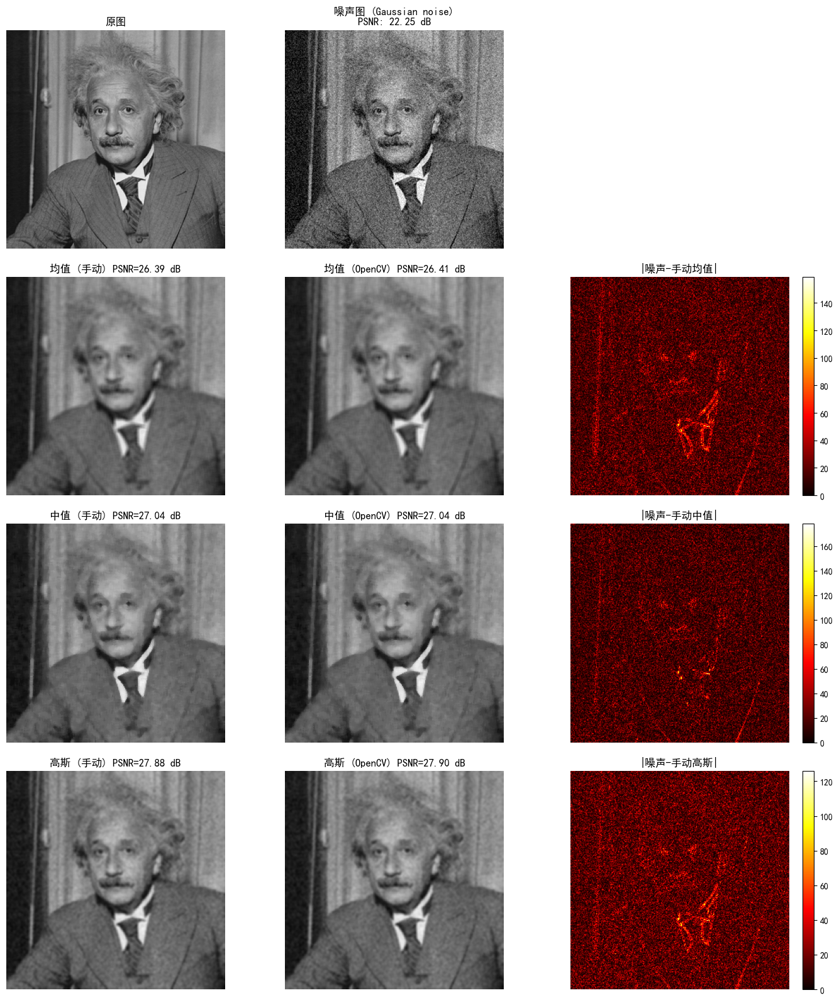

In [14]:
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False
def plot_filter_comparison(img,
                           noise_type='Gaussian noise',
                           noise_level=15,
                           noise_mean=0,
                           salt_ratio=0.5,
                           kernel_size=3,
                           sigma=1.0,
                           pad_mode='reflect',
                           seed=0):
    """
    4 行 × 3 列去噪效果对比图。

    第 1 行：原图 | 噪声图 (PSNR)
    第 2 行：手动均值滤波 | OpenCV 均值滤波 | |噪声‑手动均值|
    第 3 行：手动中值滤波 | OpenCV 中值滤波 | |噪声‑手动中值|
    第 4 行：手动高斯滤波 | OpenCV 高斯滤波 | |噪声‑手动高斯|

    每张滤波结果图标题均给出相对于原图的 PSNR。
    """
    np.random.seed(seed)
    k = int(kernel_size) | 1

    # ---------- 1. 生成噪声 ----------
    if noise_type == 'Gaussian noise':
        noisy = add_gaussian_noise(img, noise_level, noise_mean)
    elif noise_type == 'Salt-and-pepper noise':
        noisy = add_salt_pepper(img, noise_level / 100.0, salt_ratio)
    else:
        raise ValueError("noise_type 错误")
    noisy_psnr = psnr(img, noisy)

    # ---------- 2. 手动实现 ----------
    # 均值
    mean_k = mean_kernel(k)
    manual_mean = np.clip(convolve2d(noisy, mean_k, pad_mode), 0, 255).astype(np.uint8)
    # 中值
    manual_median = median_filter(noisy, k, pad_mode)
    # 高斯
    gauss_k = make_gaussian_kernel(k, sigma)
    manual_gauss = np.clip(convolve2d(noisy, gauss_k, pad_mode), 0, 255).astype(np.uint8)

    # ---------- 3. OpenCV 实现 ----------
    # 边界类型映射
    border_map = {'zero': cv2.BORDER_CONSTANT,
                  'edge': cv2.BORDER_REPLICATE,
                  'reflect': cv2.BORDER_REFLECT_101}
    border = border_map[pad_mode]

    opencv_mean = cv2.blur(noisy, (k, k), borderType=border)
    # 注意：cv2.medianBlur 不支持 borderType，默认使用 BORDER_REPLICATE
    opencv_median = cv2.medianBlur(noisy, k)
    opencv_gauss = cv2.GaussianBlur(noisy, (k, k), sigmaX=sigma, sigmaY=sigma,
                                    borderType=border)

    # ---------- 4. 计算 PSNR ----------
    psnr_vals = {
        'manual_mean': psnr(img, manual_mean),
        'opencv_mean': psnr(img, opencv_mean),
        'manual_median': psnr(img, manual_median),
        'opencv_median': psnr(img, opencv_median),
        'manual_gauss': psnr(img, manual_gauss),
        'opencv_gauss': psnr(img, opencv_gauss),
    }

    # ---------- 5. 残差图 (手动去噪) ----------
    def residual(clean, ref):
        return np.abs(ref.astype(np.int16) - clean.astype(np.int16)).astype(np.uint8)

    res_mean   = residual(manual_mean, noisy)
    res_median = residual(manual_median, noisy)
    res_gauss  = residual(manual_gauss, noisy)

    # ---------- 6. 绘图 ----------
    fig, axes = plt.subplots(4, 3, figsize=(14, 16))
    # 第一行
    axes[0, 0].imshow(img, cmap='gray', vmin=0, vmax=255)
    axes[0, 0].set_title('原图', fontweight='bold')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(noisy, cmap='gray', vmin=0, vmax=255)
    axes[0, 1].set_title(f'噪声图 ({noise_type})\nPSNR: {noisy_psnr:.2f} dB', fontweight='bold')
    axes[0, 1].axis('off')

    axes[0, 2].axis('off')   # 第一行第三列留空

    # 第二行 —— 均值滤波
    axes[1, 0].imshow(manual_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 0].set_title(f'均值 (手动) PSNR={psnr_vals["manual_mean"]:.2f} dB')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(opencv_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 1].set_title(f'均值 (OpenCV) PSNR={psnr_vals["opencv_mean"]:.2f} dB')
    axes[1, 1].axis('off')

    im1 = axes[1, 2].imshow(res_mean, cmap='hot')
    axes[1, 2].set_title('|噪声-手动均值|')
    axes[1, 2].axis('off')
    plt.colorbar(im1, ax=axes[1, 2], fraction=0.046)

    # 第三行 —— 中值滤波
    axes[2, 0].imshow(manual_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 0].set_title(f'中值 (手动) PSNR={psnr_vals["manual_median"]:.2f} dB')
    axes[2, 0].axis('off')

    axes[2, 1].imshow(opencv_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 1].set_title(f'中值 (OpenCV) PSNR={psnr_vals["opencv_median"]:.2f} dB')
    axes[2, 1].axis('off')

    im2 = axes[2, 2].imshow(res_median, cmap='hot')
    axes[2, 2].set_title('|噪声-手动中值|')
    axes[2, 2].axis('off')
    plt.colorbar(im2, ax=axes[2, 2], fraction=0.046)

    # 第四行 —— 高斯滤波
    axes[3, 0].imshow(manual_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 0].set_title(f'高斯 (手动) PSNR={psnr_vals["manual_gauss"]:.2f} dB')
    axes[3, 0].axis('off')

    axes[3, 1].imshow(opencv_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 1].set_title(f'高斯 (OpenCV) PSNR={psnr_vals["opencv_gauss"]:.2f} dB')
    axes[3, 1].axis('off')

    im3 = axes[3, 2].imshow(res_gauss, cmap='hot')
    axes[3, 2].set_title('|噪声-手动高斯|')
    axes[3, 2].axis('off')
    plt.colorbar(im3, ax=axes[3, 2], fraction=0.046)

    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    IMAGE_PATH = 'einstein.png'
    img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
    if img is None:
        img = make_demo_image()

    # 调用新绘图函数
    plot_filter_comparison(img,
                           noise_type='Gaussian noise',
                           noise_level=20,
                           kernel_size=5,
                           sigma=1.2,
                           pad_mode='reflect')

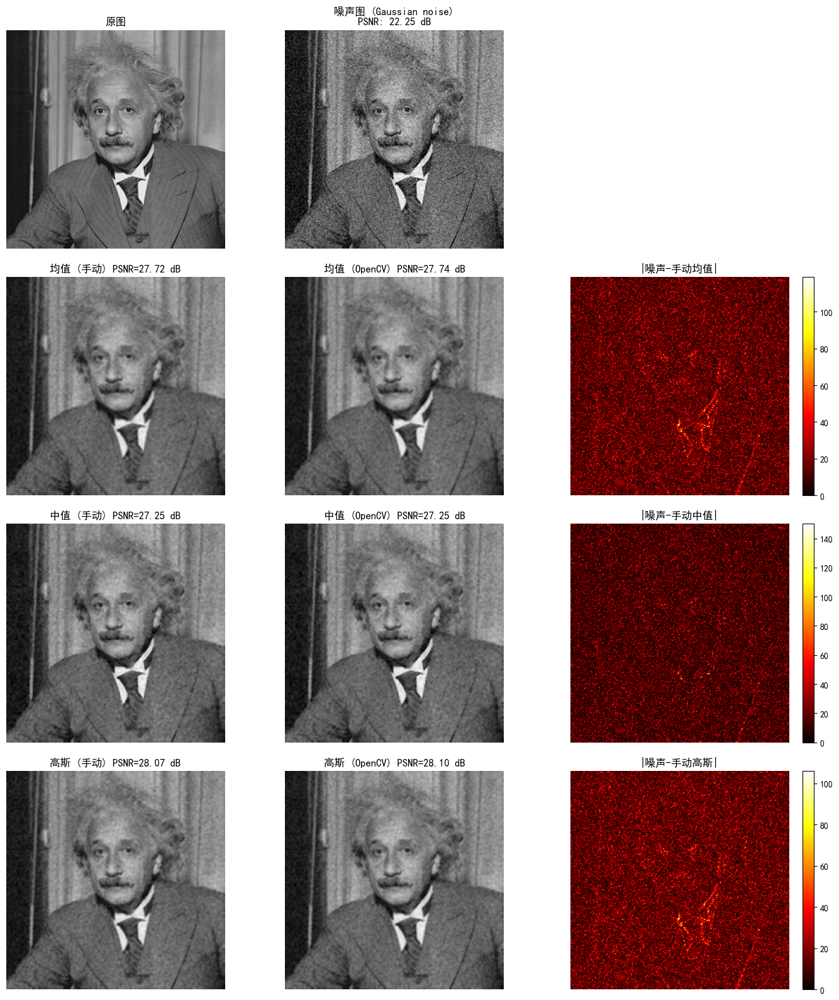

In [15]:
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False
def plot_filter_comparison(img,
                           noise_type='Gaussian noise',
                           noise_level=15,
                           noise_mean=0,
                           salt_ratio=0.5,
                           kernel_size=3,
                           sigma=1.0,
                           pad_mode='reflect',
                           seed=0):
    """
    4 行 × 3 列去噪效果对比图。

    第 1 行：原图 | 噪声图 (PSNR)
    第 2 行：手动均值滤波 | OpenCV 均值滤波 | |噪声‑手动均值|
    第 3 行：手动中值滤波 | OpenCV 中值滤波 | |噪声‑手动中值|
    第 4 行：手动高斯滤波 | OpenCV 高斯滤波 | |噪声‑手动高斯|

    每张滤波结果图标题均给出相对于原图的 PSNR。
    """
    np.random.seed(seed)
    k = int(kernel_size) | 1

    # ---------- 1. 生成噪声 ----------
    if noise_type == 'Gaussian noise':
        noisy = add_gaussian_noise(img, noise_level, noise_mean)
    elif noise_type == 'Salt-and-pepper noise':
        noisy = add_salt_pepper(img, noise_level / 100.0, salt_ratio)
    else:
        raise ValueError("noise_type 错误")
    noisy_psnr = psnr(img, noisy)

    # ---------- 2. 手动实现 ----------
    # 均值
    mean_k = mean_kernel(k)
    manual_mean = np.clip(convolve2d(noisy, mean_k, pad_mode), 0, 255).astype(np.uint8)
    # 中值
    manual_median = median_filter(noisy, k, pad_mode)
    # 高斯
    gauss_k = make_gaussian_kernel(k, sigma)
    manual_gauss = np.clip(convolve2d(noisy, gauss_k, pad_mode), 0, 255).astype(np.uint8)

    # ---------- 3. OpenCV 实现 ----------
    # 边界类型映射
    border_map = {'zero': cv2.BORDER_CONSTANT,
                  'edge': cv2.BORDER_REPLICATE,
                  'reflect': cv2.BORDER_REFLECT_101}
    border = border_map[pad_mode]

    opencv_mean = cv2.blur(noisy, (k, k), borderType=border)
    # 注意：cv2.medianBlur 不支持 borderType，默认使用 BORDER_REPLICATE
    opencv_median = cv2.medianBlur(noisy, k)
    opencv_gauss = cv2.GaussianBlur(noisy, (k, k), sigmaX=sigma, sigmaY=sigma,
                                    borderType=border)

    # ---------- 4. 计算 PSNR ----------
    psnr_vals = {
        'manual_mean': psnr(img, manual_mean),
        'opencv_mean': psnr(img, opencv_mean),
        'manual_median': psnr(img, manual_median),
        'opencv_median': psnr(img, opencv_median),
        'manual_gauss': psnr(img, manual_gauss),
        'opencv_gauss': psnr(img, opencv_gauss),
    }

    # ---------- 5. 残差图 (手动去噪) ----------
    def residual(clean, ref):
        return np.abs(ref.astype(np.int16) - clean.astype(np.int16)).astype(np.uint8)

    res_mean   = residual(manual_mean, noisy)
    res_median = residual(manual_median, noisy)
    res_gauss  = residual(manual_gauss, noisy)

    # ---------- 6. 绘图 ----------
    fig, axes = plt.subplots(4, 3, figsize=(14, 16))
    # 第一行
    axes[0, 0].imshow(img, cmap='gray', vmin=0, vmax=255)
    axes[0, 0].set_title('原图', fontweight='bold')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(noisy, cmap='gray', vmin=0, vmax=255)
    axes[0, 1].set_title(f'噪声图 ({noise_type})\nPSNR: {noisy_psnr:.2f} dB', fontweight='bold')
    axes[0, 1].axis('off')

    axes[0, 2].axis('off')   # 第一行第三列留空

    # 第二行 —— 均值滤波
    axes[1, 0].imshow(manual_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 0].set_title(f'均值 (手动) PSNR={psnr_vals["manual_mean"]:.2f} dB')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(opencv_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 1].set_title(f'均值 (OpenCV) PSNR={psnr_vals["opencv_mean"]:.2f} dB')
    axes[1, 1].axis('off')

    im1 = axes[1, 2].imshow(res_mean, cmap='hot')
    axes[1, 2].set_title('|噪声-手动均值|')
    axes[1, 2].axis('off')
    plt.colorbar(im1, ax=axes[1, 2], fraction=0.046)

    # 第三行 —— 中值滤波
    axes[2, 0].imshow(manual_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 0].set_title(f'中值 (手动) PSNR={psnr_vals["manual_median"]:.2f} dB')
    axes[2, 0].axis('off')

    axes[2, 1].imshow(opencv_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 1].set_title(f'中值 (OpenCV) PSNR={psnr_vals["opencv_median"]:.2f} dB')
    axes[2, 1].axis('off')

    im2 = axes[2, 2].imshow(res_median, cmap='hot')
    axes[2, 2].set_title('|噪声-手动中值|')
    axes[2, 2].axis('off')
    plt.colorbar(im2, ax=axes[2, 2], fraction=0.046)

    # 第四行 —— 高斯滤波
    axes[3, 0].imshow(manual_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 0].set_title(f'高斯 (手动) PSNR={psnr_vals["manual_gauss"]:.2f} dB')
    axes[3, 0].axis('off')

    axes[3, 1].imshow(opencv_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 1].set_title(f'高斯 (OpenCV) PSNR={psnr_vals["opencv_gauss"]:.2f} dB')
    axes[3, 1].axis('off')

    im3 = axes[3, 2].imshow(res_gauss, cmap='hot')
    axes[3, 2].set_title('|噪声-手动高斯|')
    axes[3, 2].axis('off')
    plt.colorbar(im3, ax=axes[3, 2], fraction=0.046)

    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    IMAGE_PATH = 'einstein.png'
    img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
    if img is None:
        img = make_demo_image()

    # 调用新绘图函数
    plot_filter_comparison(img,
                           noise_type='Gaussian noise',
                           noise_level=20,
                           kernel_size=3,
                           sigma=1.2,
                           pad_mode='reflect')

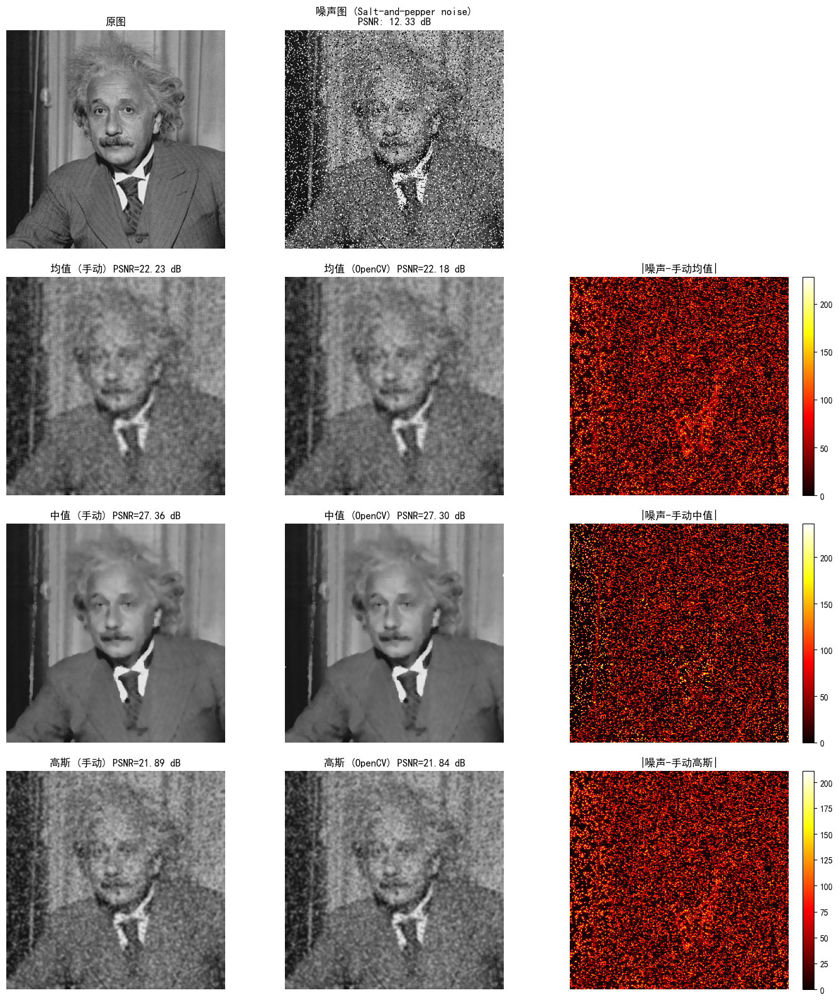

In [16]:
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False
def plot_filter_comparison(img,
                           noise_type='Gaussian noise',
                           noise_level=15,
                           noise_mean=0,
                           salt_ratio=0.5,
                           kernel_size=3,
                           sigma=1.0,
                           pad_mode='reflect',
                           seed=0):
    """
    4 行 × 3 列去噪效果对比图。

    第 1 行：原图 | 噪声图 (PSNR)
    第 2 行：手动均值滤波 | OpenCV 均值滤波 | |噪声‑手动均值|
    第 3 行：手动中值滤波 | OpenCV 中值滤波 | |噪声‑手动中值|
    第 4 行：手动高斯滤波 | OpenCV 高斯滤波 | |噪声‑手动高斯|

    每张滤波结果图标题均给出相对于原图的 PSNR。
    """
    np.random.seed(seed)
    k = int(kernel_size) | 1

    # ---------- 1. 生成噪声 ----------
    if noise_type == 'Gaussian noise':
        noisy = add_gaussian_noise(img, noise_level, noise_mean)
    elif noise_type == 'Salt-and-pepper noise':
        noisy = add_salt_pepper(img, noise_level / 100.0, salt_ratio)
    else:
        raise ValueError("noise_type 错误")
    noisy_psnr = psnr(img, noisy)

    # ---------- 2. 手动实现 ----------
    # 均值
    mean_k = mean_kernel(k)
    manual_mean = np.clip(convolve2d(noisy, mean_k, pad_mode), 0, 255).astype(np.uint8)
    # 中值
    manual_median = median_filter(noisy, k, pad_mode)
    # 高斯
    gauss_k = make_gaussian_kernel(k, sigma)
    manual_gauss = np.clip(convolve2d(noisy, gauss_k, pad_mode), 0, 255).astype(np.uint8)

    # ---------- 3. OpenCV 实现 ----------
    # 边界类型映射
    border_map = {'zero': cv2.BORDER_CONSTANT,
                  'edge': cv2.BORDER_REPLICATE,
                  'reflect': cv2.BORDER_REFLECT_101}
    border = border_map[pad_mode]

    opencv_mean = cv2.blur(noisy, (k, k), borderType=border)
    # 注意：cv2.medianBlur 不支持 borderType，默认使用 BORDER_REPLICATE
    opencv_median = cv2.medianBlur(noisy, k)
    opencv_gauss = cv2.GaussianBlur(noisy, (k, k), sigmaX=sigma, sigmaY=sigma,
                                    borderType=border)

    # ---------- 4. 计算 PSNR ----------
    psnr_vals = {
        'manual_mean': psnr(img, manual_mean),
        'opencv_mean': psnr(img, opencv_mean),
        'manual_median': psnr(img, manual_median),
        'opencv_median': psnr(img, opencv_median),
        'manual_gauss': psnr(img, manual_gauss),
        'opencv_gauss': psnr(img, opencv_gauss),
    }

    # ---------- 5. 残差图 (手动去噪) ----------
    def residual(clean, ref):
        return np.abs(ref.astype(np.int16) - clean.astype(np.int16)).astype(np.uint8)

    res_mean   = residual(manual_mean, noisy)
    res_median = residual(manual_median, noisy)
    res_gauss  = residual(manual_gauss, noisy)

    # ---------- 6. 绘图 ----------
    fig, axes = plt.subplots(4, 3, figsize=(14, 16))
    # 第一行
    axes[0, 0].imshow(img, cmap='gray', vmin=0, vmax=255)
    axes[0, 0].set_title('原图', fontweight='bold')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(noisy, cmap='gray', vmin=0, vmax=255)
    axes[0, 1].set_title(f'噪声图 ({noise_type})\nPSNR: {noisy_psnr:.2f} dB', fontweight='bold')
    axes[0, 1].axis('off')

    axes[0, 2].axis('off')   # 第一行第三列留空

    # 第二行 —— 均值滤波
    axes[1, 0].imshow(manual_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 0].set_title(f'均值 (手动) PSNR={psnr_vals["manual_mean"]:.2f} dB')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(opencv_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 1].set_title(f'均值 (OpenCV) PSNR={psnr_vals["opencv_mean"]:.2f} dB')
    axes[1, 1].axis('off')

    im1 = axes[1, 2].imshow(res_mean, cmap='hot')
    axes[1, 2].set_title('|噪声-手动均值|')
    axes[1, 2].axis('off')
    plt.colorbar(im1, ax=axes[1, 2], fraction=0.046)

    # 第三行 —— 中值滤波
    axes[2, 0].imshow(manual_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 0].set_title(f'中值 (手动) PSNR={psnr_vals["manual_median"]:.2f} dB')
    axes[2, 0].axis('off')

    axes[2, 1].imshow(opencv_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 1].set_title(f'中值 (OpenCV) PSNR={psnr_vals["opencv_median"]:.2f} dB')
    axes[2, 1].axis('off')

    im2 = axes[2, 2].imshow(res_median, cmap='hot')
    axes[2, 2].set_title('|噪声-手动中值|')
    axes[2, 2].axis('off')
    plt.colorbar(im2, ax=axes[2, 2], fraction=0.046)

    # 第四行 —— 高斯滤波
    axes[3, 0].imshow(manual_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 0].set_title(f'高斯 (手动) PSNR={psnr_vals["manual_gauss"]:.2f} dB')
    axes[3, 0].axis('off')

    axes[3, 1].imshow(opencv_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 1].set_title(f'高斯 (OpenCV) PSNR={psnr_vals["opencv_gauss"]:.2f} dB')
    axes[3, 1].axis('off')

    im3 = axes[3, 2].imshow(res_gauss, cmap='hot')
    axes[3, 2].set_title('|噪声-手动高斯|')
    axes[3, 2].axis('off')
    plt.colorbar(im3, ax=axes[3, 2], fraction=0.046)

    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    IMAGE_PATH = 'einstein.png'
    img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
    if img is None:
        img = make_demo_image()

    # 调用新绘图函数
    plot_filter_comparison(img,
                           noise_type='Salt-and-pepper noise',
                           noise_level=20,
                           kernel_size=5,
                           sigma=1.2,
                           pad_mode='reflect')

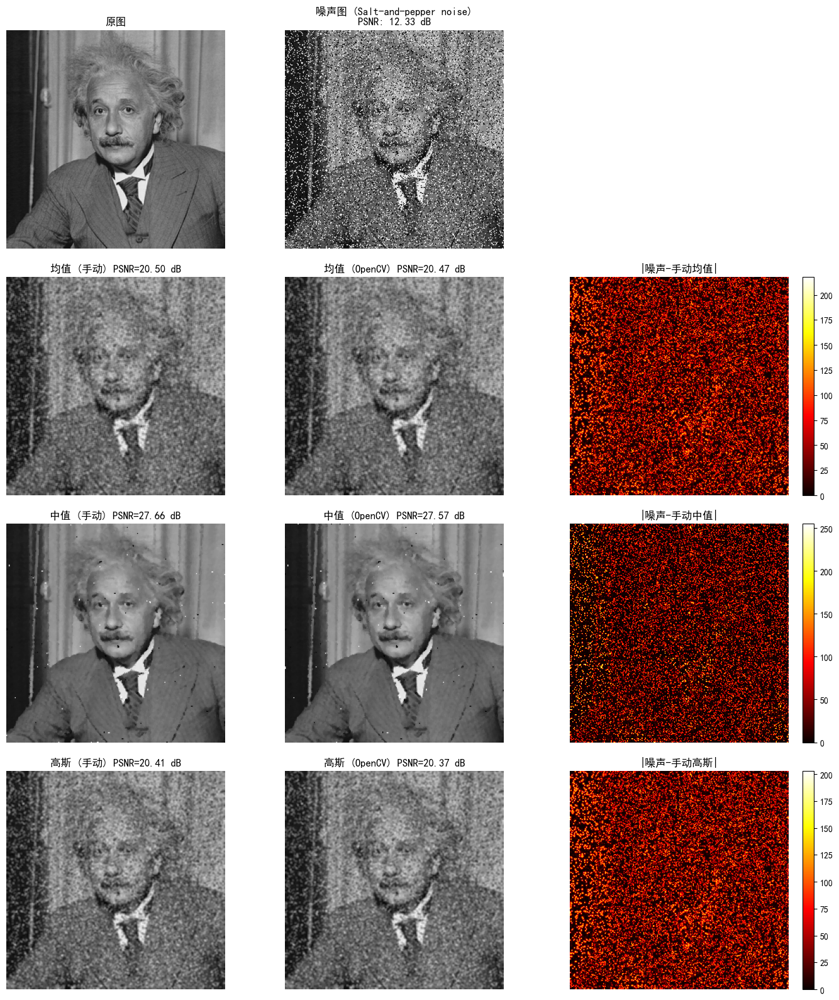

In [17]:
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False
def plot_filter_comparison(img,
                           noise_type='Gaussian noise',
                           noise_level=15,
                           noise_mean=0,
                           salt_ratio=0.5,
                           kernel_size=3,
                           sigma=1.0,
                           pad_mode='reflect',
                           seed=0):
    """
    4 行 × 3 列去噪效果对比图。

    第 1 行：原图 | 噪声图 (PSNR)
    第 2 行：手动均值滤波 | OpenCV 均值滤波 | |噪声‑手动均值|
    第 3 行：手动中值滤波 | OpenCV 中值滤波 | |噪声‑手动中值|
    第 4 行：手动高斯滤波 | OpenCV 高斯滤波 | |噪声‑手动高斯|

    每张滤波结果图标题均给出相对于原图的 PSNR。
    """
    np.random.seed(seed)
    k = int(kernel_size) | 1

    # ---------- 1. 生成噪声 ----------
    if noise_type == 'Gaussian noise':
        noisy = add_gaussian_noise(img, noise_level, noise_mean)
    elif noise_type == 'Salt-and-pepper noise':
        noisy = add_salt_pepper(img, noise_level / 100.0, salt_ratio)
    else:
        raise ValueError("noise_type 错误")
    noisy_psnr = psnr(img, noisy)

    # ---------- 2. 手动实现 ----------
    # 均值
    mean_k = mean_kernel(k)
    manual_mean = np.clip(convolve2d(noisy, mean_k, pad_mode), 0, 255).astype(np.uint8)
    # 中值
    manual_median = median_filter(noisy, k, pad_mode)
    # 高斯
    gauss_k = make_gaussian_kernel(k, sigma)
    manual_gauss = np.clip(convolve2d(noisy, gauss_k, pad_mode), 0, 255).astype(np.uint8)

    # ---------- 3. OpenCV 实现 ----------
    # 边界类型映射
    border_map = {'zero': cv2.BORDER_CONSTANT,
                  'edge': cv2.BORDER_REPLICATE,
                  'reflect': cv2.BORDER_REFLECT_101}
    border = border_map[pad_mode]

    opencv_mean = cv2.blur(noisy, (k, k), borderType=border)
    # 注意：cv2.medianBlur 不支持 borderType，默认使用 BORDER_REPLICATE
    opencv_median = cv2.medianBlur(noisy, k)
    opencv_gauss = cv2.GaussianBlur(noisy, (k, k), sigmaX=sigma, sigmaY=sigma,
                                    borderType=border)

    # ---------- 4. 计算 PSNR ----------
    psnr_vals = {
        'manual_mean': psnr(img, manual_mean),
        'opencv_mean': psnr(img, opencv_mean),
        'manual_median': psnr(img, manual_median),
        'opencv_median': psnr(img, opencv_median),
        'manual_gauss': psnr(img, manual_gauss),
        'opencv_gauss': psnr(img, opencv_gauss),
    }

    # ---------- 5. 残差图 (手动去噪) ----------
    def residual(clean, ref):
        return np.abs(ref.astype(np.int16) - clean.astype(np.int16)).astype(np.uint8)

    res_mean   = residual(manual_mean, noisy)
    res_median = residual(manual_median, noisy)
    res_gauss  = residual(manual_gauss, noisy)

    # ---------- 6. 绘图 ----------
    fig, axes = plt.subplots(4, 3, figsize=(14, 16))
    # 第一行
    axes[0, 0].imshow(img, cmap='gray', vmin=0, vmax=255)
    axes[0, 0].set_title('原图', fontweight='bold')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(noisy, cmap='gray', vmin=0, vmax=255)
    axes[0, 1].set_title(f'噪声图 ({noise_type})\nPSNR: {noisy_psnr:.2f} dB', fontweight='bold')
    axes[0, 1].axis('off')

    axes[0, 2].axis('off')   # 第一行第三列留空

    # 第二行 —— 均值滤波
    axes[1, 0].imshow(manual_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 0].set_title(f'均值 (手动) PSNR={psnr_vals["manual_mean"]:.2f} dB')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(opencv_mean, cmap='gray', vmin=0, vmax=255)
    axes[1, 1].set_title(f'均值 (OpenCV) PSNR={psnr_vals["opencv_mean"]:.2f} dB')
    axes[1, 1].axis('off')

    im1 = axes[1, 2].imshow(res_mean, cmap='hot')
    axes[1, 2].set_title('|噪声-手动均值|')
    axes[1, 2].axis('off')
    plt.colorbar(im1, ax=axes[1, 2], fraction=0.046)

    # 第三行 —— 中值滤波
    axes[2, 0].imshow(manual_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 0].set_title(f'中值 (手动) PSNR={psnr_vals["manual_median"]:.2f} dB')
    axes[2, 0].axis('off')

    axes[2, 1].imshow(opencv_median, cmap='gray', vmin=0, vmax=255)
    axes[2, 1].set_title(f'中值 (OpenCV) PSNR={psnr_vals["opencv_median"]:.2f} dB')
    axes[2, 1].axis('off')

    im2 = axes[2, 2].imshow(res_median, cmap='hot')
    axes[2, 2].set_title('|噪声-手动中值|')
    axes[2, 2].axis('off')
    plt.colorbar(im2, ax=axes[2, 2], fraction=0.046)

    # 第四行 —— 高斯滤波
    axes[3, 0].imshow(manual_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 0].set_title(f'高斯 (手动) PSNR={psnr_vals["manual_gauss"]:.2f} dB')
    axes[3, 0].axis('off')

    axes[3, 1].imshow(opencv_gauss, cmap='gray', vmin=0, vmax=255)
    axes[3, 1].set_title(f'高斯 (OpenCV) PSNR={psnr_vals["opencv_gauss"]:.2f} dB')
    axes[3, 1].axis('off')

    im3 = axes[3, 2].imshow(res_gauss, cmap='hot')
    axes[3, 2].set_title('|噪声-手动高斯|')
    axes[3, 2].axis('off')
    plt.colorbar(im3, ax=axes[3, 2], fraction=0.046)

    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    IMAGE_PATH = 'einstein.png'
    img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
    if img is None:
        img = make_demo_image()

    # 调用新绘图函数
    plot_filter_comparison(img,
                           noise_type='Salt-and-pepper noise',
                           noise_level=20,
                           kernel_size=3,
                           sigma=1.2,
                           pad_mode='reflect')

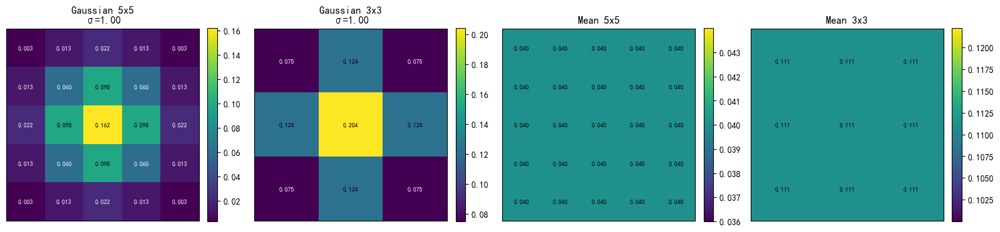

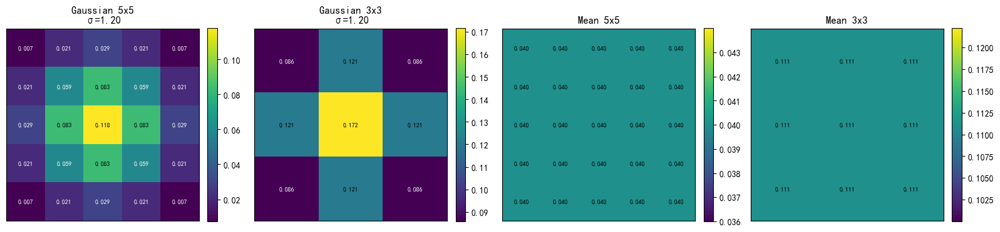

In [18]:
def plot_kernels_row(gaussian_sigma=1.0):
    """
    在一行中显示 4 个核热力图：
    高斯 5x5 | 高斯 3x3 | 均值 5x5 | 均值 3x3
    """
    # 生成核
    gauss5 = make_gaussian_kernel(5, gaussian_sigma)
    gauss3 = make_gaussian_kernel(3, gaussian_sigma)
    mean5  = mean_kernel(5)
    mean3  = mean_kernel(3)

    kernels = [
        (gauss5, f'Gaussian 5x5\nσ={gaussian_sigma:.2f}'),
        (gauss3, f'Gaussian 3x3\nσ={gaussian_sigma:.2f}'),
        (mean5,  'Mean 5x5'),
        (mean3,  'Mean 3x3'),
    ]

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    for ax, (kernel, title) in zip(axes, kernels):
        im = ax.imshow(kernel, cmap='viridis')
        ax.set_title(title, fontweight='bold')
        # 小核标注数值
        k = kernel.shape[0]
        if k <= 5:   # 5x5 也能看清，这里都标上
            for i in range(k):
                for j in range(k):
                    val = kernel[i, j]
                    color = 'white' if val < kernel.max() * 0.5 else 'black'
                    ax.text(j, i, f'{val:.3f}', ha='center', va='center',
                            color=color, fontsize=7)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

plot_kernels_row()            # 默认 σ=1.0
plot_kernels_row(1.2)         # 自定义高斯 σ

任务三：边缘检测—— Sobel / Prewitt / Laplacian / Canny 全部从零实现

=== 边缘检测结果 ===
高斯核大小: 5, Sobel/Prewitt/Laplacian 共用 σ: 0.80
Canny 阈值: (30, 80), 算子: Sobel, NMS: 开启
σ=1.0 边缘像素数: 4246, 占比: 6.48%



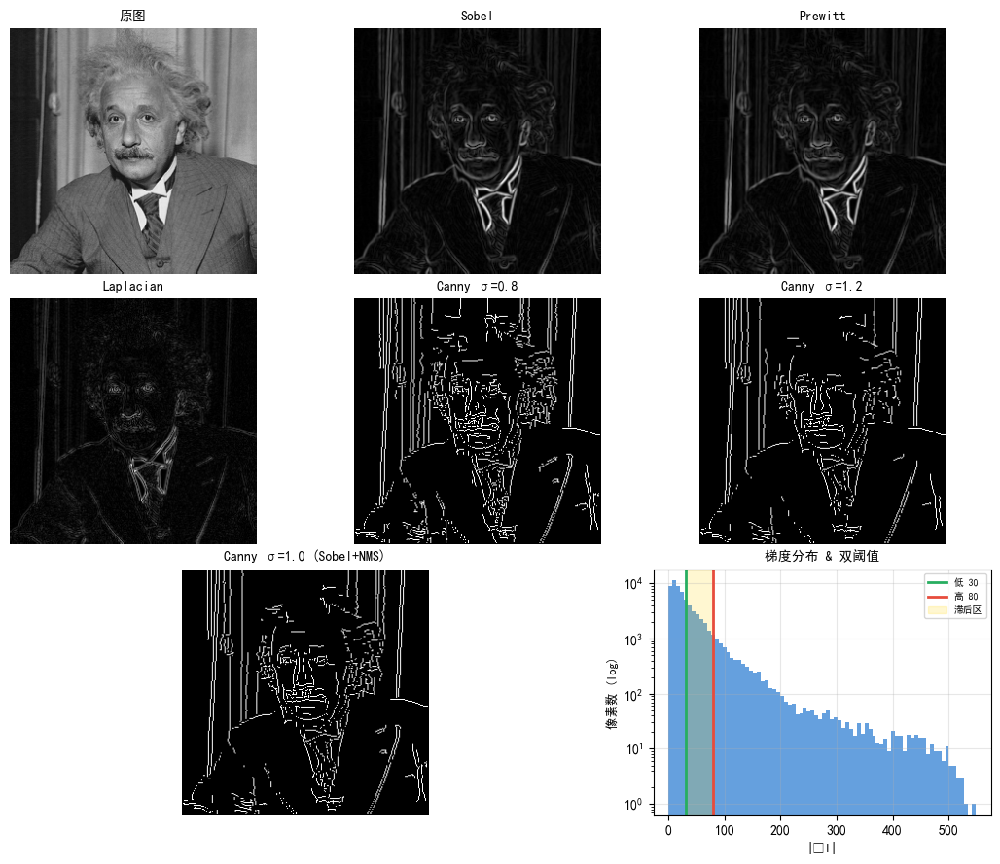

In [19]:
"""
实验3：边缘检测（无GUI版）—— Sobel / Prewitt / Laplacian / Canny 全部从零实现
直接在 Jupyter 单元格或 Python 脚本中运行，修改参数即可处理不同图片。
"""
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 中文支持（可选，若系统无对应字体可注释或改为英文）
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# ============================================================
#                       算法核心实现
# ============================================================

def pad_image(img, pH, pW, mode='reflect'):
#边界填充（与实验2相同）
    H, W = img.shape
    out = np.zeros((H + 2 * pH, W + 2 * pW), dtype=np.float32)
    out[pH:pH + H, pW:pW + W] = img
    if mode == 'zero':
        return out
    out[:pH, pW:pW + W] = img[pH:0:-1, :]
    out[pH + H:, pW:pW + W] = img[H - 2:H - 2 - pH:-1, :]
    out[:, :pW] = out[:, 2 * pW:pW:-1]
    out[:, pW + W:] = out[:, pW + W - 2:W - 2:-1]
    return out

def convolve2d(img, kernel):
#2D 相关/卷积（对称核等价）
    H, W = img.shape
    kH, kW = kernel.shape
    pH, pW = kH // 2, kW // 2
    padded = pad_image(img.astype(np.float32), pH, pW, 'reflect')
    out = np.zeros((H, W), dtype=np.float32)
    for m in range(kH):
        for n in range(kW):
            out += kernel[m, n] * padded[m:m + H, n:n + W]
    return out

def make_gaussian_kernel(k, sigma):
#高斯核
    r = k // 2
    kernel = np.zeros((k, k), dtype=np.float32)
    for i in range(k):
        for j in range(k):
            x = i - r
            y = j - r
            kernel[i, j] = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    return kernel / kernel.sum()

def gradient(img, op='Sobel'):
#一阶梯度算子（Sobel / Prewitt / Roberts）

    if op == 'Sobel':
        kx = np.array([[-1, 0, 1],
                       [-2, 0, 2],
                       [-1, 0, 1]], np.float32)
        ky = kx.T
    elif op == 'Prewitt':
        kx = np.array([[-1, 0, 1],
                       [-1, 0, 1],
                       [-1, 0, 1]], np.float32)
        ky = kx.T
    else:  # Roberts
        kx = np.array([[1, 0], [0, -1]], np.float32)
        ky = np.array([[0, 1], [-1, 0]], np.float32)
    gx = convolve2d(img, kx)
    gy = convolve2d(img, ky)
    mag = np.sqrt(gx * gx + gy * gy)
    return gx, gy, mag

def laplacian(img):
#Laplacian 二阶微分（3×3 核）
    k = np.array([[0, 1, 0],
                  [1, -4, 1],
                  [0, 1, 0]], np.float32)
    return convolve2d(img, k)

def normalize_uint8(arr):
#线性归一化到 [0,255] uint8
    a = arr - arr.min()
    if a.max() > 1e-6:
        a = a / a.max() * 255.0
    return a.astype(np.uint8)

def non_max_suppression(mag, gx, gy):
#非极大值抑制（NMS）
    H, W = mag.shape
    angle = np.arctan2(gy, gx) * 180.0 / np.pi
    angle[angle < 0] += 180
    out = np.zeros_like(mag)
    for i in range(1, H - 1):
        for j in range(1, W - 1):
            a = angle[i, j]
            if (0 <= a < 22.5) or (157.5 <= a < 180):
                p, q = mag[i, j - 1], mag[i, j + 1]
            elif 22.5 <= a < 67.5:
                p, q = mag[i - 1, j + 1], mag[i + 1, j - 1]
            elif 67.5 <= a < 112.5:
                p, q = mag[i - 1, j], mag[i + 1, j]
            else:
                p, q = mag[i - 1, j - 1], mag[i + 1, j + 1]
            if mag[i, j] >= p and mag[i, j] >= q:
                out[i, j] = mag[i, j]
    return out

def hysteresis(nms, t_low, t_high):
#双阈值 + 滞后连接
    H, W = nms.shape
    strong = nms > t_high
    weak = (nms >= t_low) & (nms <= t_high)
    edges = np.zeros((H, W), dtype=np.uint8)
    edges[strong] = 255
    ys, xs = np.where(strong)
    stack = list(zip(ys.tolist(), xs.tolist()))
    while stack:
        i, j = stack.pop()
        for di in (-1, 0, 1):
            for dj in (-1, 0, 1):
                if di == 0 and dj == 0:
                    continue
                ni, nj = i + di, j + dj
                if 0 <= ni < H and 0 <= nj < W:
                    if weak[ni, nj] and edges[ni, nj] == 0:
                        edges[ni, nj] = 255
                        stack.append((ni, nj))
    return edges

def canny_edge(img, ks, sigma, t_low, t_high, op='Sobel', use_nms=True):
#完整 Canny 算法（5步）
    gk = make_gaussian_kernel(ks, sigma)
    blur = convolve2d(img.astype(np.float32), gk)
    gx, gy, mag = gradient(blur, op)
    nms = non_max_suppression(mag, gx, gy) if use_nms else mag.copy()
    edges = hysteresis(nms, t_low, t_high)
    return edges, mag, nms

# ============================================================
#                       演示图像与主分析函数
# ============================================================

def make_demo_image():
    """生成内置演示用灰度图"""
    img = np.full((180, 180), 60, np.uint8)
    cv2.rectangle(img, (20, 20), (80, 80), 200, -1)
    cv2.circle(img, (130, 55), 28, 150, -1)
    cv2.line(img, (15, 140), (165, 140), 230, 2)
    cv2.putText(img, 'EDGE', (40, 130), cv2.FONT_HERSHEY_SIMPLEX, 0.8, 220, 2)
    return img

def plot_edge_analysis(img=None, ks=5, sigma=1.0, t_low=30, t_high=80,
                       op='Sobel', use_nms=True):
    """
    边缘检测对比展示（3 行 × 3 列，第三行左侧跨两列）：
    第一行：原图 | Sobel | Prewitt
    第二行：Laplacian | Canny(0.8) | Canny(1.2)
    第三行：Canny(1.0) 跨两列 | 阈值直方图
    """
    if img is None:
        img = make_demo_image()

    # 共用模糊
    gk = make_gaussian_kernel(ks, sigma)
    blur = convolve2d(img.astype(np.float32), gk)

    # Sobel & Prewitt
    _, _, mag_sob = gradient(blur, 'Sobel')
    _, _, mag_pre = gradient(blur, 'Prewitt')
    edge_sob = normalize_uint8(mag_sob)
    edge_pre = normalize_uint8(mag_pre)

    # Laplacian
    lap = laplacian(blur)
    edge_lap = normalize_uint8(np.abs(lap))

    # 不同 σ 的 Canny
    canny_08, _, _ = canny_edge(img, ks, sigma=0.8, t_low=t_low, t_high=t_high,
                                op=op, use_nms=use_nms)
    canny_12, _, _ = canny_edge(img, ks, sigma=1.2, t_low=t_low, t_high=t_high,
                                op=op, use_nms=use_nms)
    canny_10, mag_10, _ = canny_edge(img, ks, sigma=1.0, t_low=t_low, t_high=t_high,
                                     op=op, use_nms=use_nms)

    # 绘图（关闭 constrained_layout，手动控制间距）
    fig = plt.figure(figsize=(11, 9))
    # 极小的子图间距和四周留白
    plt.subplots_adjust(left=0.02, right=0.98, bottom=0.05, top=0.95,
                        wspace=0.02, hspace=0.1)
    gs = fig.add_gridspec(3, 3)  # 不再用 hspace/wspace 参数

    # ---- 第一行 ----
    ax00 = fig.add_subplot(gs[0, 0])
    ax00.imshow(img, cmap='gray')
    ax00.set_title('原图', fontweight='bold', fontsize=10)
    ax00.axis('off')

    ax01 = fig.add_subplot(gs[0, 1])
    ax01.imshow(edge_sob, cmap='gray')
    ax01.set_title('Sobel', fontweight='bold', fontsize=10)
    ax01.axis('off')

    ax02 = fig.add_subplot(gs[0, 2])
    ax02.imshow(edge_pre, cmap='gray')
    ax02.set_title('Prewitt', fontweight='bold', fontsize=10)
    ax02.axis('off')

    # ---- 第二行 ----
    ax10 = fig.add_subplot(gs[1, 0])
    ax10.imshow(edge_lap, cmap='gray')
    ax10.set_title('Laplacian', fontweight='bold', fontsize=10)
    ax10.axis('off')

    ax11 = fig.add_subplot(gs[1, 1])
    ax11.imshow(canny_08, cmap='gray')
    ax11.set_title('Canny σ=0.8', fontweight='bold', fontsize=10)
    ax11.axis('off')

    ax12 = fig.add_subplot(gs[1, 2])
    ax12.imshow(canny_12, cmap='gray')
    ax12.set_title('Canny σ=1.2', fontweight='bold', fontsize=10)
    ax12.axis('off')

    # ---- 第三行：Canny 跨两列，直方图占一列 ----
    ax20 = fig.add_subplot(gs[2, :2])
    ax20.imshow(canny_10, cmap='gray')
    title_canny = f'Canny σ=1.0 ({op}'
    if use_nms:
        title_canny += '+NMS'
    title_canny += ')'
    ax20.set_title(title_canny, fontweight='bold', fontsize=10)
    ax20.axis('off')

    ax21 = fig.add_subplot(gs[2, 2])
    ax21.hist(mag_10.ravel(), bins=80, color='#4a90d9', alpha=0.85,
              range=(0, max(mag_10.max(), 1)))
    ax21.axvline(t_low, color='#27ae60', lw=2, label=f'低 {t_low}')
    ax21.axvline(t_high, color='#e74c3c', lw=2, label=f'高 {t_high}')
    ax21.axvspan(t_low, t_high, color='gold', alpha=0.18, label='滞后区')
    ax21.set_title('梯度分布 & 双阈值', fontweight='bold', fontsize=10)
    ax21.set_xlabel('|∇I|', fontsize=9)
    ax21.set_ylabel('像素数 (log)', fontsize=9)
    ax21.set_yscale('log')
    ax21.legend(fontsize=7)
    ax21.grid(alpha=0.3)

    # 统计信息
    n_edge = int((canny_10 > 0).sum())
    total_pixels = canny_10.size
    print(f"=== 边缘检测结果 ===")
    print(f"高斯核大小: {ks}, Sobel/Prewitt/Laplacian 共用 σ: {sigma:.2f}")
    print(f"Canny 阈值: ({t_low}, {t_high}), 算子: {op}, NMS: {'开启' if use_nms else '关闭'}")
    print(f"σ=1.0 边缘像素数: {n_edge}, 占比: {100 * n_edge / total_pixels:.2f}%")
    print()

    plt.show()

# ============================================================
#                       主程序入口
# ============================================================
if __name__ == '__main__':
    # ---------- 可修改参数 ----------
    IMAGE_PATH = 'einstein.png'          # 设置为图片路径，例如 'my_image.jpg'，None 使用内置演示图
    KS = 5                     # 高斯核大小（奇数）
    SIGMA = 0.8              # 高斯标准差
    T_LOW = 30                 # Canny 低阈值
    T_HIGH = 80                # Canny 高阈值
    OP = 'Sobel'               # Canny 梯度算子：'Sobel', 'Prewitt', 'Roberts'
    USE_NMS = True             # 是否开启非极大值抑制
    # --------------------------------

    # 读取图像
    if IMAGE_PATH:
        img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"⚠️ 无法读取 {IMAGE_PATH}，使用内置演示图")
            img = make_demo_image()
        else:
            # 保持图像大小，不强制缩放（原 GUI 强制缩放至 180×180）
            pass
    else:
        img = make_demo_image()

    # 运行分析并显示
    plot_edge_analysis(img, ks=KS, sigma=SIGMA, t_low=T_LOW, t_high=T_HIGH,
                       op=OP, use_nms=USE_NMS)

任务4:拉普拉斯金字塔融合

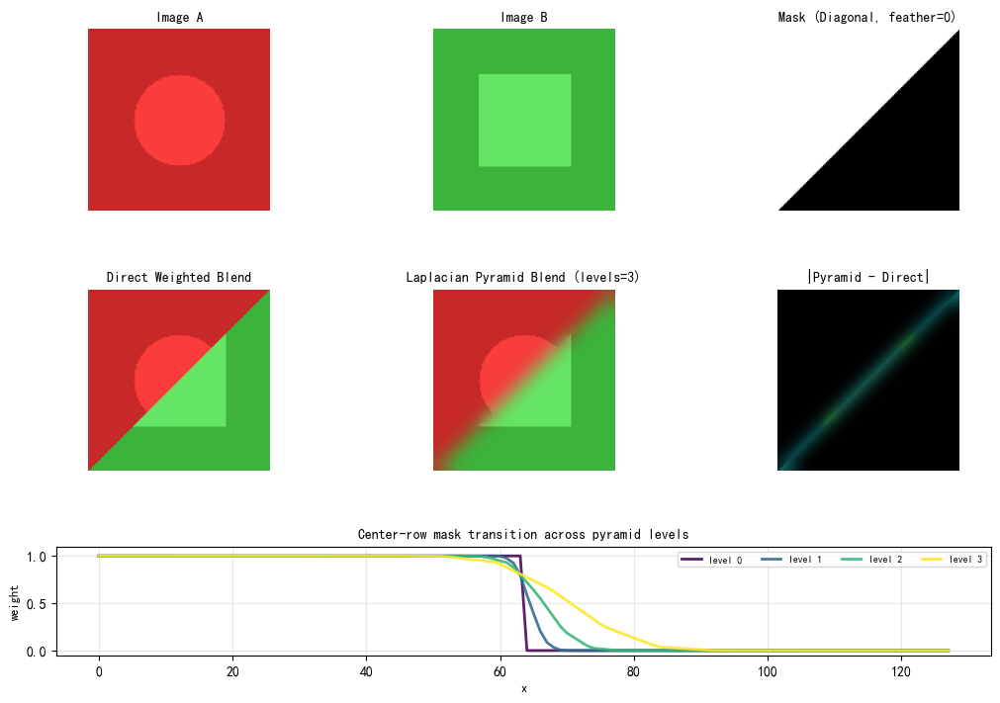

=== 融合指标 ===
金字塔层级: 3, 高斯σ: 1.00
掩膜类型: Diagonal, 羽化宽度: 0 px
图像尺寸: 128×128
直接混合 vs 金字塔混合:
  平均绝对差: 6.110
  最大绝对差: 102.0
  非零像素比例: 49.45%



In [9]:
"""
实验4：拉普拉斯金字塔融合（无GUI版）
直接在 Jupyter 单元格或脚本中运行，可读取自定义图片。
"""
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib
# 中文支持（可选）
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# ============================================================
#                        核心算法
# ============================================================

def pad_reflect(img, r):
#镜像边界填充（单通道）
    if img.ndim != 2:
        raise ValueError("pad_reflect expects a 2-D single-channel image.")
    r = int(r)
    img_f = img.astype(np.float32)
    if r == 0:
        return img_f.copy()
    H, W = img_f.shape
    if H <= r or W <= r:
        mode = "reflect" if H > 1 and W > 1 else "edge"
        return np.pad(img_f, ((r, r), (r, r)), mode=mode).astype(np.float32)
    out = np.zeros((H + 2 * r, W + 2 * r), dtype=np.float32)
    out[r:r + H, r:r + W] = img_f
    out[:r, r:r + W] = img_f[r:0:-1, :]
    out[r + H:, r:r + W] = img_f[H - 2:H - 2 - r:-1, :]
    out[:, :r] = out[:, 2 * r:r:-1]
    out[:, r + W:] = out[:, r + W - 2:W - 2:-1]
    return out

def make_gaussian_kernel(k, sigma):
#生成归一化高斯核
    k = int(k) | 1
    r = k // 2
    kernel = np.zeros((k, k), dtype=np.float32)
    for i in range(k):
        for j in range(k):
            x, y = i - r, j - r
            kernel[i, j] = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    kernel /= kernel.sum()
    return kernel

def conv2d_single(img, kernel):
#单通道手动二维滤波
    H, W = img.shape
    kH, kW = kernel.shape
    p = kH // 2
    padded = pad_reflect(img.astype(np.float32), p)
    out = np.zeros((H, W), dtype=np.float32)
    for m in range(kH):
        for n in range(kW):
            out += kernel[m, n] * padded[m:m + H, n:n + W]
    return out

def conv2d_color(img, kernel):
#彩色图像逐通道滤波
    if img.ndim == 2:
        return conv2d_single(img, kernel)
    out = np.zeros_like(img, dtype=np.float32)
    for c in range(img.shape[2]):
        out[..., c] = conv2d_single(img[..., c], kernel)
    return out

def pyr_down(img, kernel):
#手动下采样（先高斯模糊后隔行隔列采样）
    blurred = conv2d_color(img, kernel)
    return blurred[::2, ::2]

def pyr_up(img, kernel, target_shape):
#手动上采样（零插值后4倍高斯滤波，裁剪至目标尺寸）
    H, W = img.shape[:2]
    if img.ndim == 3:
        up = np.zeros((H * 2, W * 2, img.shape[2]), dtype=np.float32)
    else:
        up = np.zeros((H * 2, W * 2), dtype=np.float32)
    up[::2, ::2] = img
    out = conv2d_color(up, 4.0 * kernel)
    return out[:target_shape[0], :target_shape[1]]

def gaussian_pyramid(img, levels, kernel):
#构建高斯金字塔
    pyramid = [img.astype(np.float32)]
    for _ in range(levels):
        pyramid.append(pyr_down(pyramid[-1], kernel))
    return pyramid

def laplacian_pyramid(img, levels, kernel):
#构建拉普拉斯金字塔（含最顶层的低通残差）
    G = gaussian_pyramid(img, levels, kernel)
    L = []
    for i in range(levels):
        up = pyr_up(G[i + 1], kernel, G[i].shape)
        L.append(G[i] - up)
    L.append(G[-1])
    return L

def reconstruct_from_laplacian(pyramid, kernel):
#从拉普拉斯金字塔重建原图
    out = pyramid[-1].astype(np.float32)
    for i in range(len(pyramid) - 2, -1, -1):
        out = pyr_up(out, kernel, pyramid[i].shape) + pyramid[i]
    return out

def _prepare_mask_for_image(mask, image):
#使掩膜与图像尺寸匹配
    mask_f = mask.astype(np.float32)
    if mask_f.ndim == 2 and image.ndim == 3:
        mask_f = mask_f[..., None]
    elif mask_f.ndim == 3 and image.ndim == 2:
        mask_f = mask_f[..., 0]
    return mask_f

def pyramid_blend(A, B, mask, levels, kernel):
#拉普拉斯金字塔融合
    mask = _prepare_mask_for_image(mask, A)
    LA = laplacian_pyramid(A, levels, kernel)
    LB = laplacian_pyramid(B, levels, kernel)
    GM = gaussian_pyramid(mask, levels, kernel)
    blended = [gm * la + (1.0 - gm) * lb for la, lb, gm in zip(LA, LB, GM)]
    out = reconstruct_from_laplacian(blended, kernel)
    return np.clip(out, 0, 255).astype(np.uint8)

def direct_blend(A, B, mask):
#直接加权混合（用于对比）
    mask = _prepare_mask_for_image(mask, A)
    return np.clip(mask * A.astype(np.float32) + (1.0 - mask) * B.astype(np.float32),
                   0, 255).astype(np.uint8)

def make_mask(size, mode='Left-Right', feather=0):
#生成混合掩膜（size × size × 3）
    mask = np.zeros((size, size, 3), dtype=np.float32)
    if mode == 'Left-Right':
        center = size // 2
        mask[:, :center] = 1.0
        if feather > 0:
            for x in range(center - feather, center + feather):
                if 0 <= x < size:
                    val = (center + feather - x) / (2.0 * feather)
                    mask[:, x] = np.clip(val, 0.0, 1.0)
    elif mode == 'Circle':
        cy = cx = size // 2
        radius = size // 3
        for y in range(size):
            for x in range(size):
                dist = np.sqrt((y - cy)**2 + (x - cx)**2)
                if feather > 0:
                    val = np.clip((radius + feather - dist) / (2.0 * feather), 0.0, 1.0)
                else:
                    val = 1.0 if dist <= radius else 0.0
                mask[y, x] = val
    elif mode == 'Diagonal':
        for y in range(size):
            for x in range(size):
                diff = size - (x + y)
                if feather > 0:
                    val = np.clip((diff + feather) / (2.0 * feather), 0.0, 1.0)
                else:
                    val = 1.0 if diff > 0 else 0.0
                mask[y, x] = val
    return mask

def make_demo_AB(size=128):
#生成内置演示用图像对（BGR格式）
    A = np.zeros((size, size, 3), dtype=np.uint8)
    A[:] = (40, 40, 200)  # 红色调
    cv2.circle(A, (size//2, size//2), max(2, size//4), (60, 60, 250), -1)

    B = np.zeros((size, size, 3), dtype=np.uint8)
    B[:] = (60, 180, 60)  # 绿色调
    pad = max(1, size//4)
    cv2.rectangle(B, (pad, pad), (size-pad, size-pad), (100, 230, 100), -1)
    return A, B

def compute_blending_result(A=None, B=None, size=128, levels=3, sigma=1.0,
                            mask_mode='Left-Right', feather=0):
#完整的融合流程，返回包含所有中间结果的字典
    if A is None or B is None:
        A, B = make_demo_AB(size)
    else:
        A = cv2.resize(A, (size, size))
        B = cv2.resize(B, (size, size))

    kernel = make_gaussian_kernel(5, sigma)
    mask = make_mask(size, mask_mode, feather)
    pyramid = pyramid_blend(A, B, mask, levels, kernel)
    direct = direct_blend(A, B, mask)
    mask_pyramid = gaussian_pyramid(mask, levels, kernel)

    return {
        'A': A,
        'B': B,
        'kernel': kernel,
        'mask': mask,
        'pyramid': pyramid,
        'direct': direct,
        'mask_pyramid': mask_pyramid
    }

def blend_metrics(pyramid, direct):
#计算两种融合方式之间的差异
    diff = np.abs(pyramid.astype(np.float32) - direct.astype(np.float32))
    return {
        'mean_abs_diff': float(diff.mean()),
        'max_abs_diff': float(diff.max()),
        'nonzero_ratio': float(np.count_nonzero(diff) / diff.size)
    }

# ============================================================
#                        可视化函数
# ============================================================

def _bgr_to_rgb(img):
    """将 OpenCV 的 BGR 图像转换为 RGB 用于 matplotlib 显示"""
    if img.ndim == 3 and img.shape[2] == 3:
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def plot_blending_analysis(A=None, B=None, size=128, levels=3, sigma=1.0,
                           mask_mode='Left-Right', feather=0):
    """
    生成完整的融合分析图：
    原图A | 原图B | 掩膜
    直接混合 | 金字塔混合 | 差异图 (|金字塔-直接|)
    各层掩膜中心行过渡曲线
    """
    result = compute_blending_result(A, B, size, levels, sigma, mask_mode, feather)
    A_img = result['A']
    B_img = result['B']
    mask = result['mask']
    direct = result['direct']
    pyramid = result['pyramid']
    mask_pyramid = result['mask_pyramid']

    # 【关键修改1：画布整体收窄，紧凑尺寸】
    fig = plt.figure(figsize=(10, 7), constrained_layout=True)
    # 【关键修改2：减小行列空白间距、压缩底部曲线高度占比】
    gs = fig.add_gridspec(3, 3, hspace=0.25, wspace=0.15, height_ratios=[1, 1, 0.6])

    # 第一行：A, B, Mask
    ax_a = fig.add_subplot(gs[0, 0])
    ax_a.imshow(_bgr_to_rgb(A_img))
    ax_a.set_title('Image A', fontweight='bold', fontsize=10)
    ax_a.axis('off')

    ax_b = fig.add_subplot(gs[0, 1])
    ax_b.imshow(_bgr_to_rgb(B_img))
    ax_b.set_title('Image B', fontweight='bold', fontsize=10)
    ax_b.axis('off')

    ax_m = fig.add_subplot(gs[0, 2])
    ax_m.imshow(mask)
    ax_m.set_title(f'Mask ({mask_mode}, feather={feather})', fontweight='bold', fontsize=10)
    ax_m.axis('off')

    # 第二行：Direct, Pyramid, Diff
    ax_d = fig.add_subplot(gs[1, 0])
    ax_d.imshow(_bgr_to_rgb(direct))
    ax_d.set_title('Direct Weighted Blend', fontweight='bold', fontsize=10)
    ax_d.axis('off')

    ax_p = fig.add_subplot(gs[1, 1])
    ax_p.imshow(_bgr_to_rgb(pyramid))
    ax_p.set_title(f'Laplacian Pyramid Blend (levels={levels})', fontweight='bold', fontsize=10)
    ax_p.axis('off')

    diff = np.abs(pyramid.astype(np.int16) - direct.astype(np.int16)).astype(np.uint8)
    ax_diff = fig.add_subplot(gs[1, 2])
    ax_diff.imshow(diff)
    ax_diff.set_title('|Pyramid - Direct|', fontweight='bold', fontsize=10)
    ax_diff.axis('off')

    # 第三行：各层掩膜中心行曲线
    ax_curve = fig.add_subplot(gs[2, :])
    try:
        cmap = matplotlib.colormaps.get_cmap('viridis').resampled(len(mask_pyramid))
    except Exception:
        cmap = matplotlib.cm.get_cmap('viridis', len(mask_pyramid))

    for i, gm in enumerate(mask_pyramid):
        # 将各层掩膜重采样到原图尺寸，取中心行
        center_row = cv2.resize(gm[..., 0], (size, size))[size // 2, :]
        ax_curve.plot(np.arange(size), center_row, lw=2.0, alpha=0.88,
                      color=cmap(i), label=f'level {i}')
    ax_curve.set_title('Center-row mask transition across pyramid levels', fontweight='bold', fontsize=10)
    ax_curve.set_xlabel('x', fontsize=9)
    ax_curve.set_ylabel('weight', fontsize=9)
    ax_curve.set_ylim(-0.05, 1.1)
    ax_curve.legend(fontsize=7, ncol=min(len(mask_pyramid), 7), loc='upper right')
    ax_curve.grid(alpha=0.3)

    plt.show()

    # 打印数值指标
    metrics = blend_metrics(pyramid, direct)
    print("=== 融合指标 ===")
    print(f"金字塔层级: {levels}, 高斯σ: {sigma:.2f}")
    print(f"掩膜类型: {mask_mode}, 羽化宽度: {feather} px")
    print(f"图像尺寸: {size}×{size}")
    print(f"直接混合 vs 金字塔混合:")
    print(f"  平均绝对差: {metrics['mean_abs_diff']:.3f}")
    print(f"  最大绝对差: {metrics['max_abs_diff']:.1f}")
    print(f"  非零像素比例: {metrics['nonzero_ratio']:.2%}")
    print()

    return result

# ============================================================
#                        主程序入口
# ============================================================
if __name__ == '__main__':
    # ---------- 可修改参数 ----------
    IMAGE_PATH_A = None      # 例如 'imageA.jpg'，None 使用内置图
    IMAGE_PATH_B = None      # 例如 'imageB.jpg'，None 使用内置图
    SIZE = 128               # 输出图像尺寸（正方形）
    LEVELS = 3               # 金字塔层级（≥1）
    SIGMA = 1.0              # 高斯核标准差
    MASK_MODE = 'Diagonal' # 掩膜类型：'Left-Right', 'Circle', 'Diagonal'
    FEATHER = 0              # 羽化宽度（像素）
    # --------------------------------

    # 读取图像（若提供）
    if IMAGE_PATH_A and IMAGE_PATH_B:
        imgA = cv2.imread(IMAGE_PATH_A)
        imgB = cv2.imread(IMAGE_PATH_B)
        if imgA is None or imgB is None:
            print("⚠️ 无法读取其中一张图像，改用内置演示图")
            imgA, imgB = make_demo_AB(SIZE)
        else:
            imgA = cv2.resize(imgA, (SIZE, SIZE))
            imgB = cv2.resize(imgB, (SIZE, SIZE))
    else:
        imgA, imgB = make_demo_AB(SIZE)

    # 运行分析并显示
    plot_blending_analysis(imgA, imgB, SIZE, LEVELS, SIGMA, MASK_MODE, FEATHER)

renwu5

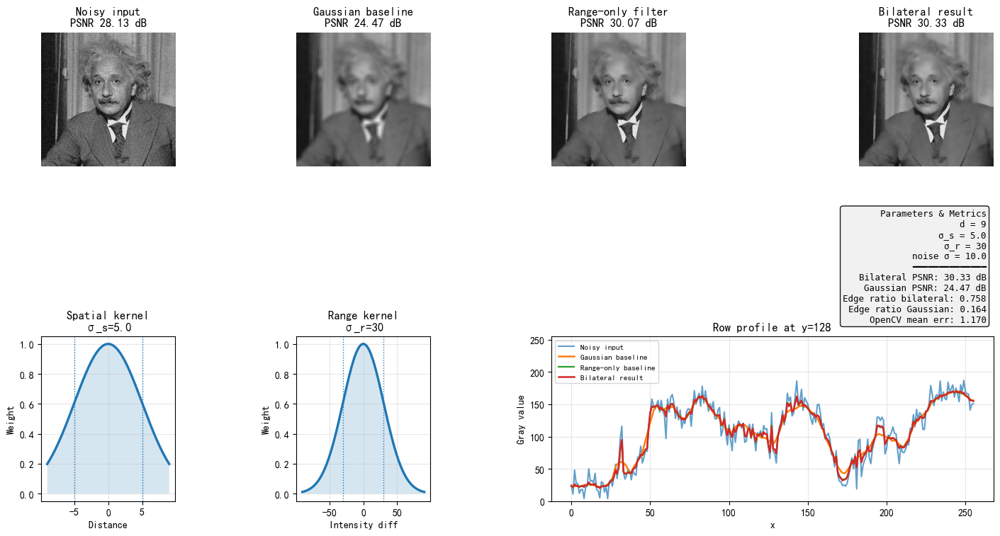

双边滤波实验指标
噪声标准差: 10.0, d=9, σ_s=5.0, σ_r=30
噪声PSNR: 28.13 dB
高斯滤波PSNR: 24.47 dB
范围滤波PSNR: 30.07 dB
双边滤波PSNR: 30.33 dB
双边滤波边缘保留比率: 0.758
高斯滤波边缘保留比率: 0.164
与OpenCV差异: max=15.00, mean=1.170


In [ ]:
"""
实验5：双边滤波（无GUI版）
直接在 Jupyter 单元格或脚本中运行，支持读取自定义灰度图像。
"""
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 中文支持（若无对应字体可注释或改为英文）
plt.rcParams['font.sans-serif'] = ['SimHei', 'Microsoft YaHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# ============================================================
#                        核心算法（完全保留）
# ============================================================

def pad_reflect(img, r):
#镜像边界填充（单通道）
    if img.ndim != 2:
        raise ValueError("pad_reflect 仅支持单通道图像")
    r = int(r)
    img_f = img.astype(np.float32)
    if r == 0:
        return img_f.copy()
    H, W = img_f.shape
    if H <= r or W <= r:
        mode = "reflect" if H > 1 and W > 1 else "edge"
        return np.pad(img_f, ((r, r), (r, r)), mode=mode).astype(np.float32)
    out = np.zeros((H + 2 * r, W + 2 * r), dtype=np.float32)
    out[r:r + H, r:r + W] = img_f
    out[:r, r:r + W] = img_f[r:0:-1, :]
    out[r + H:, r:r + W] = img_f[H - 2:H - 2 - r:-1, :]
    out[:, :r] = out[:, 2 * r:r:-1]
    out[:, r + W:] = out[:, r + W - 2:W - 2:-1]
    return out

def gaussian_filter(img, k, sigma):
#手动高斯滤波（仅空间域）
    k = int(k) | 1  # 保证奇数
    sigma = float(sigma)
    r = k // 2
    ax = np.arange(k, dtype=np.float32) - r
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx ** 2 + yy ** 2) / (2.0 * sigma * sigma))
    kernel /= kernel.sum()
    padded = pad_reflect(img.astype(np.float32), r)
    H, W = img.shape
    out = np.zeros((H, W), dtype=np.float32)
    for m in range(k):
        for n in range(k):
            out += kernel[m, n] * padded[m:m + H, n:n + W]
    return np.clip(out, 0, 255).astype(np.uint8)

def range_only_filter(img, k, sigma_r):
#仅范围核滤波（无空间距离）
    img_u8 = img if img.dtype == np.uint8 else np.clip(img, 0, 255).astype(np.uint8)
    k = int(k) | 1
    sigma_r = float(sigma_r)
    H, W = img_u8.shape
    r = k // 2
    img_f = img_u8.astype(np.float32)
    padded = pad_reflect(img_f, r)
    out = np.zeros_like(img_f)
    weight_sum = np.zeros_like(img_f)
    for di in range(-r, r + 1):
        for dj in range(-r, r + 1):
            shifted = padded[r + di:r + di + H, r + dj:r + dj + W]
            wr = np.exp(-((shifted - img_f) ** 2) / (2.0 * sigma_r * sigma_r))
            out += wr * shifted
            weight_sum += wr
    out /= np.maximum(weight_sum, 1e-12)
    return np.clip(out, 0, 255).astype(np.uint8)

def bilateral_filter(img, d, sigma_s, sigma_r):
#手动双边滤波
    img_u8 = img if img.dtype == np.uint8 else np.clip(img, 0, 255).astype(np.uint8)
    d = int(d) | 1
    sigma_s = float(sigma_s)
    sigma_r = float(sigma_r)
    H, W = img_u8.shape
    r = d // 2
    img_f = img_u8.astype(np.float32)
    padded = pad_reflect(img_f, r)
    out = np.zeros_like(img_f)
    weight_sum = np.zeros_like(img_f)
    for di in range(-r, r + 1):
        for dj in range(-r, r + 1):
            shifted = padded[r + di:r + di + H, r + dj:r + dj + W]
            ws = np.exp(-(di * di + dj * dj) / (2.0 * sigma_s * sigma_s))
            wr = np.exp(-((shifted - img_f) ** 2) / (2.0 * sigma_r * sigma_r))
            weight = ws * wr
            out += weight * shifted
            weight_sum += weight
    out /= np.maximum(weight_sum, 1e-12)
    return np.clip(out, 0, 255).astype(np.uint8)

def add_gaussian_noise(img, sigma, seed=None):
#添加高斯白噪声
    img_u8 = img if img.dtype == np.uint8 else np.clip(img, 0, 255).astype(np.uint8)
    if sigma <= 0:
        return img_u8.copy()
    if seed is not None:
        rng = np.random.default_rng(seed)
        noise = rng.normal(0, sigma, img_u8.shape)
    else:
        noise = np.random.randn(*img_u8.shape) * sigma
    return np.clip(img_u8.astype(np.float32) + noise, 0, 255).astype(np.uint8)

def psnr(reference, test):
#峰值信噪比
    ref = reference.astype(np.float32)
    tst = test.astype(np.float32)
    mse = np.mean((ref - tst) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * np.log10(255.0 / np.sqrt(mse))

def gradient_magnitude(img):
#简单中心差分梯度幅值
    img_f = img.astype(np.float32)
    gx = np.zeros_like(img_f)
    gy = np.zeros_like(img_f)
    gx[:, 1:-1] = (img_f[:, 2:] - img_f[:, :-2]) * 0.5
    gx[:, 0] = img_f[:, 1] - img_f[:, 0]
    gx[:, -1] = img_f[:, -1] - img_f[:, -2]
    gy[1:-1, :] = (img_f[2:, :] - img_f[:-2, :]) * 0.5
    gy[0, :] = img_f[1, :] - img_f[0, :]
    gy[-1, :] = img_f[-1, :] - img_f[-2, :]
    return np.sqrt(gx * gx + gy * gy)

def edge_preservation_ratio(clean, processed, threshold=25.0):
#边缘保留比率（越高越好）
    clean_grad = gradient_magnitude(clean)
    proc_grad = gradient_magnitude(processed)
    edge_mask = clean_grad >= threshold
    if not np.any(edge_mask):
        return float('nan')
    denom = np.mean(clean_grad[edge_mask])
    if denom == 0:
        return float('nan')
    return float(np.mean(proc_grad[edge_mask]) / denom)

def compare_with_cv2_bilateral_filter(img, d, sigma_s, sigma_r):
#与 OpenCV 双边滤波对比
    manual = bilateral_filter(img, d, sigma_s, sigma_r)
    reference = cv2.bilateralFilter(
        img, d=d, sigmaColor=sigma_r, sigmaSpace=sigma_s,
        borderType=cv2.BORDER_REFLECT_101)
    diff = np.abs(manual.astype(np.float32) - reference.astype(np.float32))
    return manual, reference, float(diff.max()), float(diff.mean())

def make_demo_image(size=150):
#生成内置演示图像
    img = np.full((size, size), 80, np.uint8)
    scale = size / 150.0
    cv2.rectangle(img, (int(20*scale), int(20*scale)),
                  (int(70*scale), int(70*scale)), 200, -1)
    cv2.rectangle(img, (int(80*scale), int(80*scale)),
                  (int(130*scale), int(130*scale)), 160, -1)
    return img

def run_bilateral_demo(clean, noise_sigma=10.0, d=9, sigma_s=5.0, sigma_r=30.0, seed=0):
#完整的处理流程，返回结果和指标
    clean_img = clean if clean.dtype == np.uint8 else np.clip(clean, 0, 255).astype(np.uint8)
    noisy = add_gaussian_noise(clean_img, noise_sigma, seed)
    gaussian = gaussian_filter(noisy, d, sigma_s)
    range_only = range_only_filter(noisy, d, sigma_r)
    bilateral = bilateral_filter(noisy, d, sigma_s, sigma_r)
    _, cv2_ref, _, _ = compare_with_cv2_bilateral_filter(noisy, d, sigma_s, sigma_r)
    cv2_diff = np.abs(bilateral.astype(np.float32) - cv2_ref.astype(np.float32))
    metrics = {
        'psnr_noisy': psnr(clean_img, noisy),
        'psnr_gaussian': psnr(clean_img, gaussian),
        'psnr_range_only': psnr(clean_img, range_only),
        'psnr_bilateral': psnr(clean_img, bilateral),
        'edge_ratio_gaussian': edge_preservation_ratio(clean_img, gaussian),
        'edge_ratio_bilateral': edge_preservation_ratio(clean_img, bilateral),
        'cv2_max_error': float(cv2_diff.max()),
        'cv2_mean_error': float(cv2_diff.mean()),
    }
    return {
        'clean': clean_img,
        'noisy': noisy,
        'gaussian': gaussian,
        'range_only': range_only,
        'bilateral': bilateral,
        'cv2_reference': cv2_ref,
        'metrics': metrics,
        'parameters': {'noise_sigma': noise_sigma, 'd': d, 'sigma_s': sigma_s, 'sigma_r': sigma_r, 'seed': seed}
    }

# ============================================================
#                        可视化与主程序
# ============================================================

def plot_bilateral_analysis(clean=None, noise_sigma=10.0, d=9, sigma_s=5.0, sigma_r=30.0, seed=0):
    """
    生成完整的双边滤波分析图：
    第一行：噪声输入 | 高斯滤波 | 范围核滤波 | 双边滤波
    第二行：空间核曲线 | 范围核曲线 | 行剖面
    指标以表格形式显示在右侧。
    """
    demo = run_bilateral_demo(clean, noise_sigma, d, sigma_s, sigma_r, seed)
    clean_img = demo['clean']
    noisy = demo['noisy']
    gaussian = demo['gaussian']
    range_only = demo['range_only']
    bilateral = demo['bilateral']
    metrics = demo['metrics']
    params = demo['parameters']

    fig = plt.figure(figsize=(14, 7.5), constrained_layout=True)
    # 两行四列，但第二行最右侧两列合并用于行剖面
    gs = fig.add_gridspec(2, 4, hspace=0.45, wspace=0.35, height_ratios=[1.0, 0.9])

    # 第一行四个图像
    ax_noisy = fig.add_subplot(gs[0, 0])
    ax_gaussian = fig.add_subplot(gs[0, 1])
    ax_range = fig.add_subplot(gs[0, 2])
    ax_bilateral = fig.add_subplot(gs[0, 3])

    ax_noisy.imshow(noisy, cmap='gray', vmin=0, vmax=255)
    ax_noisy.set_title(f'Noisy input\nPSNR {metrics["psnr_noisy"]:.2f} dB', fontweight='bold')
    ax_noisy.axis('off')

    ax_gaussian.imshow(gaussian, cmap='gray', vmin=0, vmax=255)
    ax_gaussian.set_title(f'Gaussian baseline\nPSNR {metrics["psnr_gaussian"]:.2f} dB', fontweight='bold')
    ax_gaussian.axis('off')

    ax_range.imshow(range_only, cmap='gray', vmin=0, vmax=255)
    ax_range.set_title(f'Range-only filter\nPSNR {metrics["psnr_range_only"]:.2f} dB', fontweight='bold')
    ax_range.axis('off')

    ax_bilateral.imshow(bilateral, cmap='gray', vmin=0, vmax=255)
    ax_bilateral.set_title(f'Bilateral result\nPSNR {metrics["psnr_bilateral"]:.2f} dB', fontweight='bold')
    ax_bilateral.axis('off')

    # 第二行：空间核、范围核、行剖面（占据右侧两列）
    ax_spatial = fig.add_subplot(gs[1, 0])
    ax_range_kernel = fig.add_subplot(gs[1, 1])
    ax_profile = fig.add_subplot(gs[1, 2:])   # 合并 2,3 列

    # 空间核曲线
    x_s = np.linspace(-params['d'], params['d'], 200)
    y_s = np.exp(-x_s**2 / (2*params['sigma_s']**2))
    ax_spatial.plot(x_s, y_s, lw=2.4)
    ax_spatial.fill_between(x_s, 0, y_s, alpha=0.18)
    ax_spatial.axvline(-params['sigma_s'], ls=':', lw=1)
    ax_spatial.axvline(params['sigma_s'], ls=':', lw=1)
    ax_spatial.set_title(f'Spatial kernel\nσ_s={params["sigma_s"]:.1f}', fontweight='bold')
    ax_spatial.set_xlabel('Distance'); ax_spatial.set_ylabel('Weight')
    ax_spatial.grid(alpha=0.3)

    # 范围核曲线
    x_r = np.linspace(-3*params['sigma_r'], 3*params['sigma_r'], 200)
    y_r = np.exp(-x_r**2 / (2*params['sigma_r']**2))
    ax_range_kernel.plot(x_r, y_r, lw=2.4)
    ax_range_kernel.fill_between(x_r, 0, y_r, alpha=0.18)
    ax_range_kernel.axvline(-params['sigma_r'], ls=':', lw=1)
    ax_range_kernel.axvline(params['sigma_r'], ls=':', lw=1)
    ax_range_kernel.set_title(f'Range kernel\nσ_r={params["sigma_r"]:.0f}', fontweight='bold')
    ax_range_kernel.set_xlabel('Intensity diff'); ax_range_kernel.set_ylabel('Weight')
    ax_range_kernel.grid(alpha=0.3)

    # 行剖面
    row = noisy.shape[0] // 2
    ax_profile.plot(noisy[row], label='Noisy input', alpha=0.7)
    ax_profile.plot(gaussian[row], label='Gaussian baseline', lw=1.8)
    ax_profile.plot(range_only[row], label='Range-only baseline', lw=1.6)
    ax_profile.plot(bilateral[row], label='Bilateral result', lw=1.8)
    ax_profile.set_title(f'Row profile at y={row}', fontweight='bold')
    ax_profile.set_xlabel('x'); ax_profile.set_ylabel('Gray value')
    ax_profile.set_ylim(0, 255)
    ax_profile.legend(fontsize=8)
    ax_profile.grid(alpha=0.3)

    # 指标表格（放置在图外右侧，使用 fig.text 或单独子图，此处选用 fig.text 简洁方式）
    table_text = (
        f"Parameters & Metrics\n"
        f"d = {params['d']}\n"
        f"σ_s = {params['sigma_s']:.1f}\n"
        f"σ_r = {params['sigma_r']:.0f}\n"
        f"noise σ = {params['noise_sigma']:.1f}\n"
        f"━━━━━━━━━━━━━━\n"
        f"Bilateral PSNR: {metrics['psnr_bilateral']:.2f} dB\n"
        f"Gaussian PSNR: {metrics['psnr_gaussian']:.2f} dB\n"
        f"Edge ratio bilateral: {metrics['edge_ratio_bilateral']:.3f}\n"
        f"Edge ratio Gaussian: {metrics['edge_ratio_gaussian']:.3f}\n"
        f"OpenCV mean err: {metrics['cv2_mean_error']:.3f}"
    )
    fig.text(0.99, 0.5, table_text, transform=fig.transFigure, fontsize=9,
             fontfamily='monospace', verticalalignment='center',
             horizontalalignment='right', bbox=dict(boxstyle='round', facecolor='#f0f0f0', alpha=0.9))

    plt.show()

    print("=" * 50)
    print("双边滤波实验指标")
    print(f"噪声标准差: {params['noise_sigma']:.1f}, d={params['d']}, σ_s={params['sigma_s']:.1f}, σ_r={params['sigma_r']:.0f}")
    print(f"噪声PSNR: {metrics['psnr_noisy']:.2f} dB")
    print(f"高斯滤波PSNR: {metrics['psnr_gaussian']:.2f} dB")
    print(f"范围滤波PSNR: {metrics['psnr_range_only']:.2f} dB")
    print(f"双边滤波PSNR: {metrics['psnr_bilateral']:.2f} dB")
    print(f"双边滤波边缘保留比率: {metrics['edge_ratio_bilateral']:.3f}")
    print(f"高斯滤波边缘保留比率: {metrics['edge_ratio_gaussian']:.3f}")
    print(f"与OpenCV差异: max={metrics['cv2_max_error']:.2f}, mean={metrics['cv2_mean_error']:.3f}")
    print("=" * 50)

    return demo


if __name__ == '__main__':
    # ---------- 可修改参数 ----------
    IMAGE_PATH = 'einstein.png'         # 例如 'my_image.jpg'，None 使用内置演示图
    NOISE_SIGMA = 10.0         # 高斯噪声标准差
    D = 9                      # 邻域直径（奇数）
    SIGMA_S = 5.0              # 空间高斯标准差
    SIGMA_R = 30.0             # 范围高斯标准差
    # --------------------------------

    # 读取图像
    if IMAGE_PATH:
        img = cv2.imread(IMAGE_PATH, cv2.IMREAD_GRAYSCALE)
        if img is None:
            print(f"⚠️ 无法读取 {IMAGE_PATH}，使用内置演示图")
            img = make_demo_image()
    else:
        img = make_demo_image()

    # 运行分析并显示
    plot_bilateral_analysis(img, NOISE_SIGMA, D, SIGMA_S, SIGMA_R)